# **Data Loading**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df=pd.read_csv(r'/content/huzarabad_data.csv')

In [ ]:
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,POWER (KW),"""WEEKEND/WEEKDAY""",SEASON,Temp (F),Humidity (%),Wind Gust
0,0,01-01-2021,01-00,11.6,102,0.96,1967.388015,0,1,65,90,13.679999
1,1,01-01-2021,02-00,11.6,102,0.96,1967.388015,0,1,65,90,12.599999
2,2,01-01-2021,03-00,11.6,102,0.96,1967.388015,0,1,65,90,10.799999
3,3,01-01-2021,04-00,11.3,130,0.96,2442.607331,0,1,78,49,7.920000
4,4,01-01-2021,05-00,11.2,148,0.96,2756.205522,0,1,78,49,6.479999


In [ ]:
df.shape

(8760, 12)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         8760 non-null   int64  
 1   DATE               8760 non-null   object 
 2   TIME               8760 non-null   object 
 3   VOLTAGE            8760 non-null   float64
 4   CURRENT            8760 non-null   int64  
 5   PF                 8760 non-null   float64
 6   POWER (KW)         8760 non-null   float64
 7   "WEEKEND/WEEKDAY"  8760 non-null   int64  
 8   SEASON             8760 non-null   int64  
 9   Temp (F)           8760 non-null   int64  
 10  Humidity (%)       8760 non-null   int64  
 11  Wind Gust          8760 non-null   float64
dtypes: float64(4), int64(6), object(2)
memory usage: 821.4+ KB


In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
DATE,0
TIME,0
VOLTAGE,0
CURRENT,0
PF,0
POWER (KW),0
"""WEEKEND/WEEKDAY""",0
SEASON,0
Temp (F),0


# **Feature Engineering**

extract: day, year, month_name, month, day_name from DATE column


In [ ]:
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%m-%Y')
df['Year'] = df['DATE'].dt.year
df['Day Name'] = df['DATE'].dt.day_name()
df['Day'] = df['DATE'].dt.day
df['Month'] = df['DATE'].dt.month

In [ ]:
df

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,POWER (KW),"""WEEKEND/WEEKDAY""",SEASON,Temp (F),Humidity (%),Wind Gust,Year,Day Name,Day,Month
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,65,90,13.679999,2021,Friday,1,1
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,65,90,12.599999,2021,Friday,1,1
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,65,90,10.799999,2021,Friday,1,1
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,78,49,7.920000,2021,Friday,1,1
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,78,49,6.479999,2021,Friday,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,8755,2021-12-31,20-00,11.6,64,0.95,1221.580794,0,1,67,92,20.519999,2021,Friday,31,12
8756,8756,2021-12-31,21-00,11.5,62,0.95,1173.204615,0,1,67,92,17.280000,2021,Friday,31,12
8757,8757,2021-12-31,22-00,11.5,57,0.95,1078.591339,0,1,65,94,16.919998,2021,Friday,31,12
8758,8758,2021-12-31,23-00,11.5,48,0.95,908.287443,0,1,65,94,16.919998,2021,Friday,31,12


In [ ]:
df.columns

Index(['Unnamed: 0', 'DATE', 'TIME', 'VOLTAGE', 'CURRENT', 'PF', 'POWER (KW)',
       '"WEEKEND/WEEKDAY"', 'SEASON', 'Temp (F)', 'Humidity (%)', 'Wind Gust',
       'Year', 'Day Name', 'Day', 'Month'],
      dtype='object')

In [ ]:
# convert F to D
df['Temp (C)'] = (df['Temp (F)'] - 32) * 5/9
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,POWER (KW),"""WEEKEND/WEEKDAY""",SEASON,Temp (F),Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C)
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,65,90,13.679999,2021,Friday,1,1,18.333333
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,65,90,12.599999,2021,Friday,1,1,18.333333
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,65,90,10.799999,2021,Friday,1,1,18.333333
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,78,49,7.920000,2021,Friday,1,1,25.555556
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,78,49,6.479999,2021,Friday,1,1,25.555556


In [ ]:
df = df.drop(columns=['Temp (F)'])
df.head(2)

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,POWER (KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C)
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,1,1,18.333333
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,1,1,18.333333


In [ ]:
# make the column if Day Name is sunday 0,monday 1 and all

df['Day_Encoded'] = df['Day Name'].map({'Sunday': 0, 'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6})
df.head(2)

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,POWER (KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,1,1,18.333333,5
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,1,1,18.333333,5


In [ ]:
df = df.rename(columns={'POWER (KW)': 'Demand(KW)'})

In [ ]:
# Calculate the correlation matrix, only including numeric columns

correlation_matrix = df.corr(numeric_only=True)['Demand(KW)'].sort_values(ascending=False)
correlation_matrix

,Demand(KW)
Demand(KW),1.000000
CURRENT,0.992841
Temp (C),0.170709
Wind Gust,0.164077
PF,0.122641
"""WEEKEND/WEEKDAY""",0.015093
Day_Encoded,0.008612
SEASON,-0.021097
Day,-0.041137
Month,-0.235523


# **EDA**

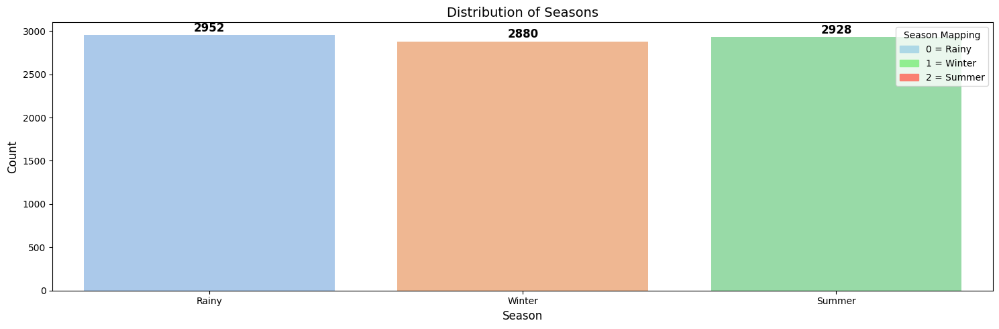

In [ ]:
# Count the occurrences of each season
season_counts = df['SEASON'].value_counts().sort_index()

# Define season labels
season_labels = {0: 'Rainy', 1: 'Winter', 2: 'Summer'}

# Convert numeric index to season names for x-axis
season_names = [season_labels[i] for i in season_counts.index]

# Plot
plt.figure(figsize=(15, 5))
bars = sns.barplot(x=season_names, y=season_counts.values, palette='pastel')

# Add counts on top of bars
for bar, count in zip(bars.patches, season_counts.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 10,  # adjust y for spacing
             f'{count}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Title and labels
plt.title('Distribution of Seasons', fontsize=14)
plt.xlabel('Season', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Add legend
from matplotlib.patches import Patch
legend_labels = [Patch(color='lightblue', label='0 = Rainy'),
                 Patch(color='lightgreen', label='1 = Winter'),
                 Patch(color='salmon', label='2 = Summer')]
plt.legend(handles=legend_labels, title='Season Mapping', loc='upper right')

plt.tight_layout()
plt.show()


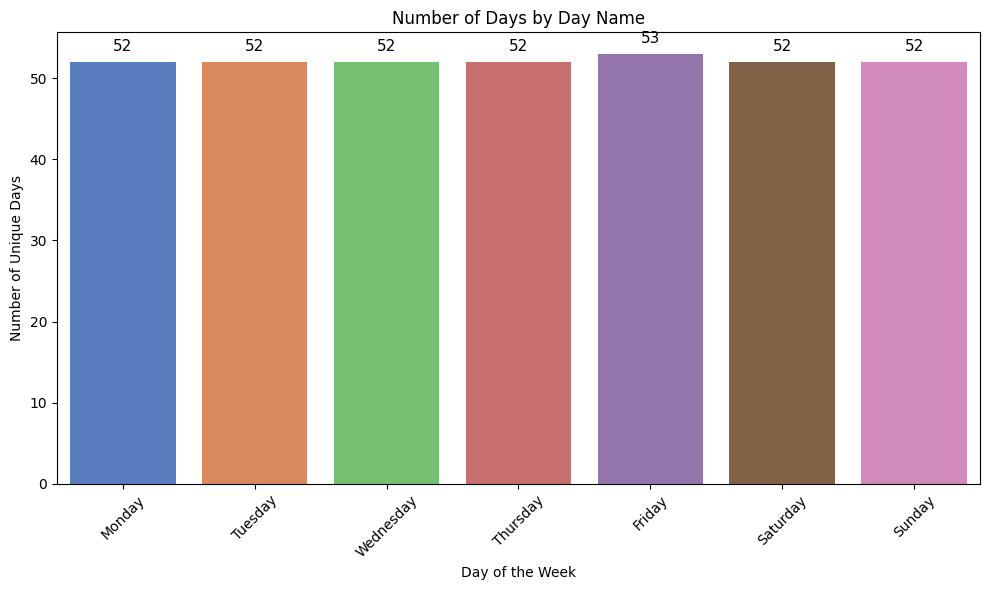

In [ ]:
# Ensure DATE is datetime
df['DATE'] = pd.to_datetime(df['DATE'])

# Drop duplicates to get one row per day
daily_df = df.drop_duplicates(subset='DATE')

# Now count unique days by 'Day Name'
day_counts = daily_df['Day Name'].value_counts().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=day_counts.index, y=day_counts.values, palette='muted')

# Add count labels on top
for i, count in enumerate(day_counts.values):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=11)

plt.title('Number of Days by Day Name')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Unique Days')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


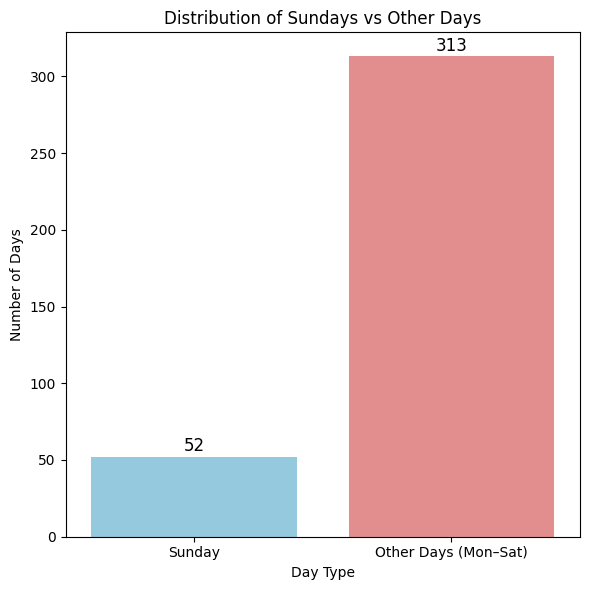

In [ ]:
# Ensure DATE is datetime
df['DATE'] = pd.to_datetime(df['DATE'])

# Get one row per day using groupby
daily_df = df.groupby('DATE').first().reset_index()

# Count how many Sundays and how many other days
sunday_count = (daily_df['Day Name'] == 'Sunday').sum()
other_days_count = len(daily_df) - sunday_count  # Total days - Sunday

# Create a new Series for plotting
plot_data = pd.Series({
    'Sunday': sunday_count,
    'Other Days (Mon–Sat)': other_days_count
})

# Plot
plt.figure(figsize=(6, 6))
sns.barplot(x=plot_data.index, y=plot_data.values, palette=['skyblue', 'lightcoral'])

# Annotate count on top
for i, count in enumerate(plot_data.values):
    plt.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=12)

plt.title('Distribution of Sundays vs Other Days')
plt.ylabel('Number of Days')
plt.xlabel('Day Type')
plt.tight_layout()
plt.show()


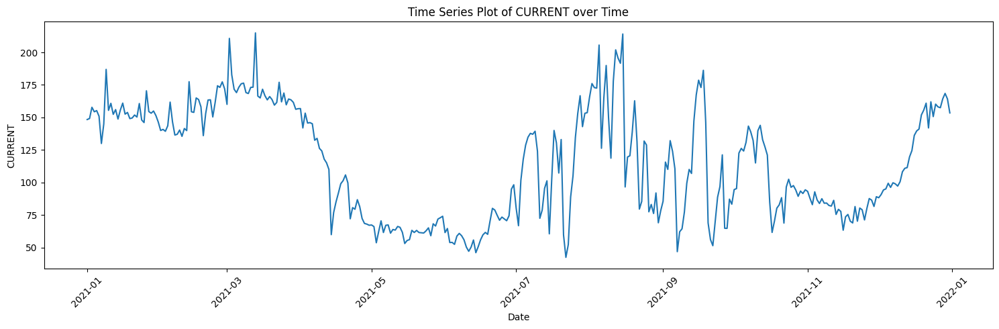

In [ ]:
# plot time series plot of CURRENT

plt.figure(figsize=(15, 5))
sns.lineplot(data=df, x='DATE', y='CURRENT', estimator='mean', errorbar=None) # Using mean to aggregate if needed

plt.title('Time Series Plot of CURRENT over Time')
plt.xlabel('Date')
plt.ylabel('CURRENT')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

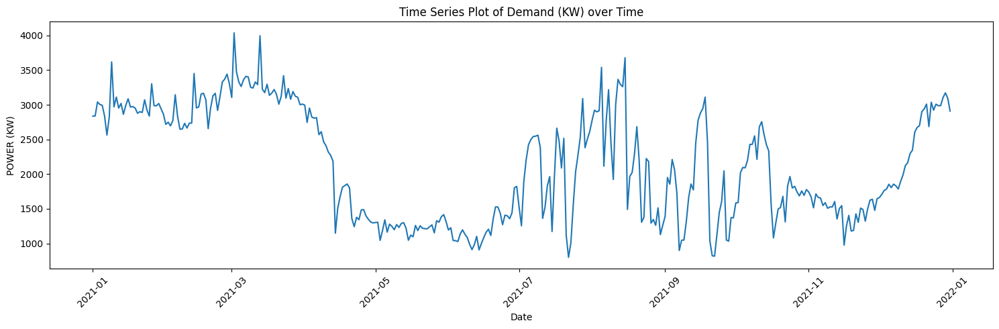

In [ ]:
# plot time series plot of Demand(KW)
plt.figure(figsize=(15, 5))
sns.lineplot(data=df, x='DATE', y='Demand(KW)', estimator='mean', errorbar=None) # Using mean to aggregate if needed
plt.title('Time Series Plot of Demand (KW) over Time')
plt.xlabel('Date')
plt.ylabel('POWER (KW)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

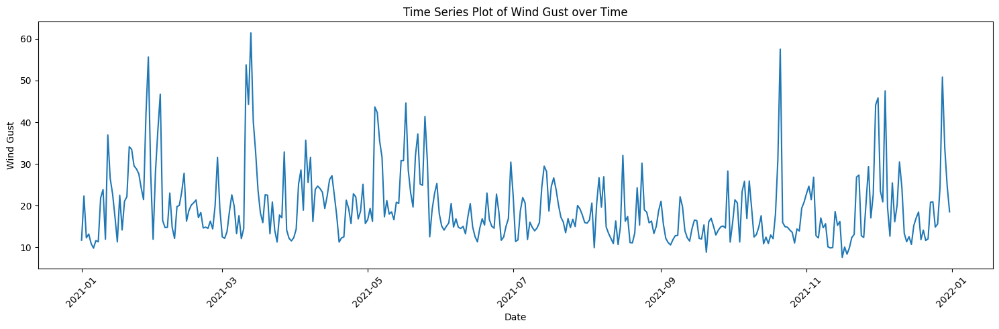

In [ ]:
# plot time series plot of Wind Gust
plt.figure(figsize=(15, 5))
sns.lineplot(data=df, x='DATE', y='Wind Gust', estimator='mean', errorbar=None)
plt.title('Time Series Plot of Wind Gust over Time')
plt.xlabel('Date')
plt.ylabel('Wind Gust')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

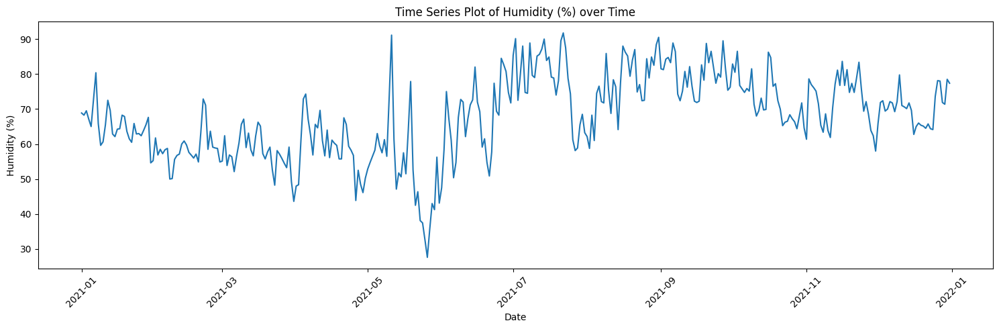

In [ ]:
# plot time series plot of Humidity (%)
plt.figure(figsize=(15, 5))
sns.lineplot(data=df, x='DATE', y='Humidity (%)', estimator='mean', errorbar=None)
plt.title('Time Series Plot of Humidity (%) over Time')
plt.xlabel('Date')
plt.ylabel('Humidity (%)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

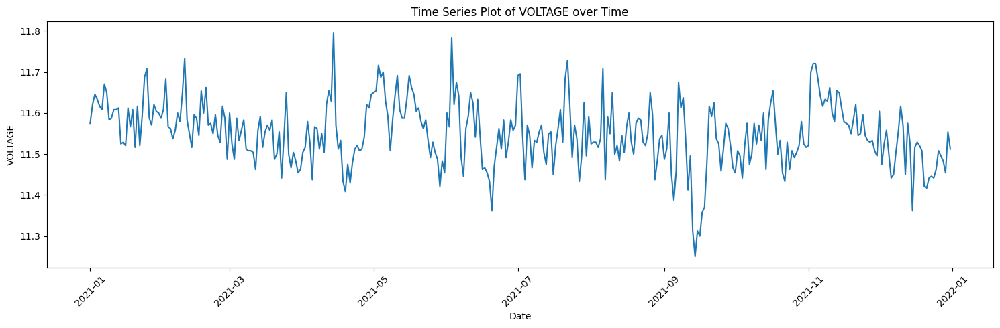

In [ ]:
# plot time series plot of VOLTAGE
plt.figure(figsize=(15, 5))
sns.lineplot(data=df, x='DATE', y='VOLTAGE', estimator='mean', errorbar=None)
plt.title('Time Series Plot of VOLTAGE over Time')
plt.xlabel('Date')
plt.ylabel('VOLTAGE')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

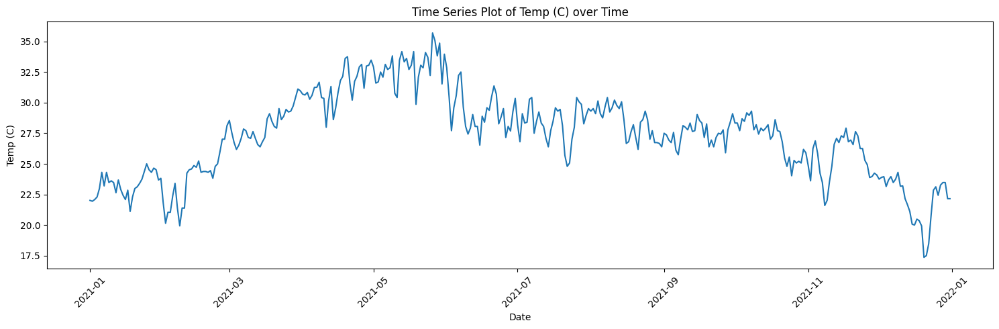

In [ ]:
# plot time series plot of Temp (C)
plt.figure(figsize=(15, 5))
sns.lineplot(data=df, x='DATE', y='Temp (C)', estimator='mean', errorbar=None)
plt.title('Time Series Plot of Temp (C) over Time')
plt.xlabel('Date')
plt.ylabel('Temp (C)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

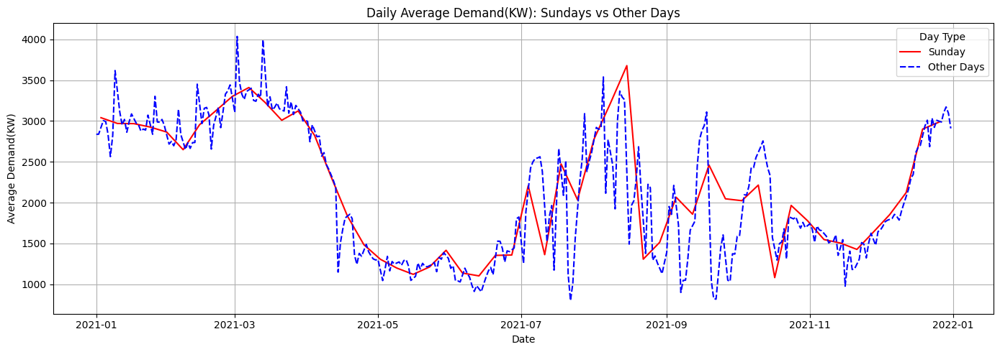

In [ ]:
# Time Series plot of sunday and other data

# Ensure datetime format
df['DATE'] = pd.to_datetime(df['DATE'])

# Extract day name and day only
df['Day Name'] = df['DATE'].dt.day_name()
df['Day'] = df['DATE'].dt.date

# Filter Sunday and other days
sunday_df = df[df['Day Name'] == 'Sunday']
other_df = df[df['Day Name'] != 'Sunday']

# Get full list of dates (365 unique days)
all_dates = pd.date_range(start=df['DATE'].min().date(), end=df['DATE'].max().date(), freq='D')

# Calculate daily averages
sunday_power = sunday_df.groupby('Day')['Demand(KW)'].mean()
sunday_power = sunday_power.reindex(all_dates.date, fill_value=np.nan)

# Filter only Sundays from full date range
sunday_power = sunday_power[pd.to_datetime(sunday_power.index).weekday == 6]

# Other days
other_power = other_df.groupby('Day')['Demand(KW)'].mean()
other_power = other_power.reindex(all_dates.date, fill_value=np.nan)

# Remove Sundays from other_power
other_power = other_power[pd.to_datetime(other_power.index).weekday != 6]

power_df = pd.DataFrame({
    'Sunday': sunday_power,
    'Other Days': other_power
})
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(14, 5))
sns.lineplot(data=power_df, palette=['red', 'blue'])
plt.title('Daily Average Demand(KW): Sundays vs Other Days')
plt.xlabel('Date')
plt.ylabel('Average Demand(KW)')
plt.legend(title='Day Type')
plt.grid(True)
plt.tight_layout()
plt.show()

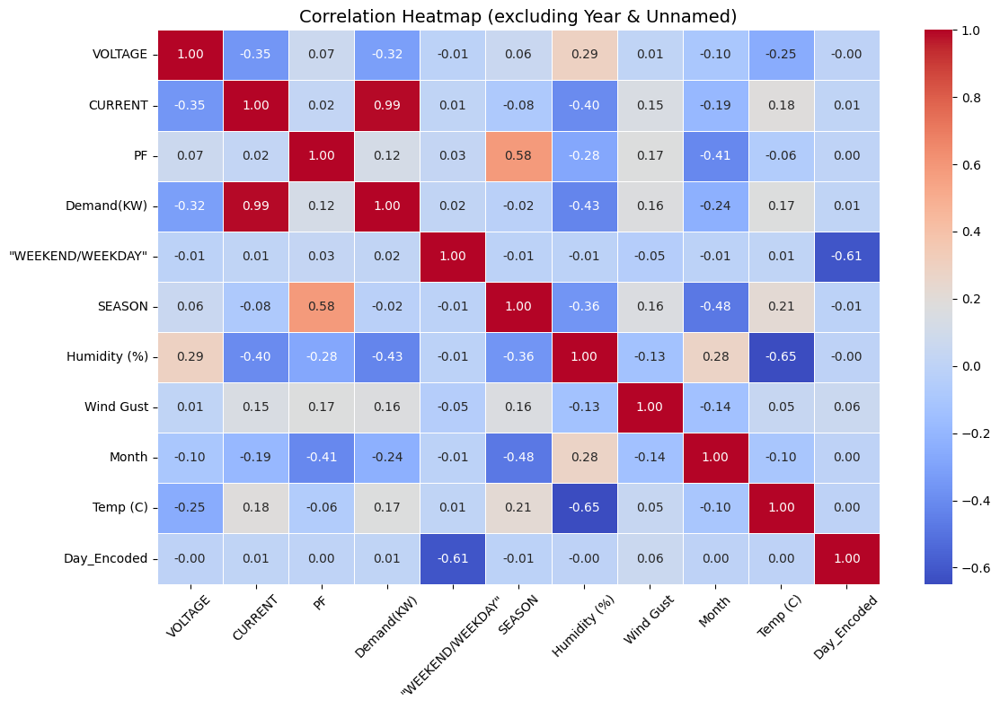

In [ ]:
# Drop 'Year' and 'Unnamed: 0' from DataFrame
numeric_df = df.select_dtypes(include=['number']).drop(columns=['Year', 'Unnamed: 0'], errors='ignore')

# Compute correlation matrix
correlation_matrix = numeric_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)

plt.title('Correlation Heatmap (excluding Year & Unnamed)', fontsize=14)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


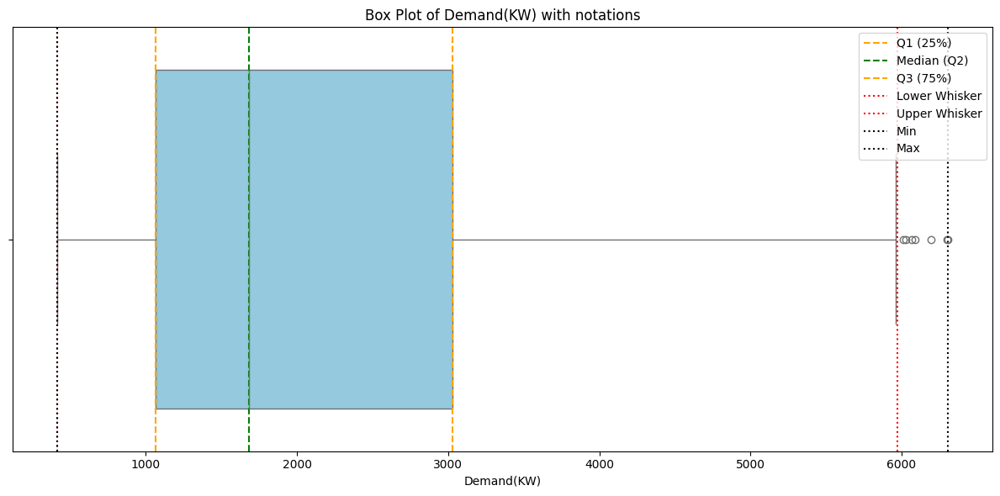

Q1 (25%): 1062.66
Median (Q2): 1683.69
Q3 (75%): 3025.77
IQR: 1963.11
Lower Whisker: 412.03
Upper Whisker: 5970.44
Min: 412.03
Max: 6306.21
Number of Outliers: 7


In [ ]:
# Calculate summary statistics
q1 = df['Demand(KW)'].quantile(0.25)
q2 = df['Demand(KW)'].quantile(0.50)
q3 = df['Demand(KW)'].quantile(0.75)
iqr = q3 - q1
lower_whisker = max(df['Demand(KW)'].min(), q1 - 1.5 * iqr)
upper_whisker = min(df['Demand(KW)'].max(), q3 + 1.5 * iqr)
outliers = df[(df['Demand(KW)'] < lower_whisker) | (df['Demand(KW)'] > upper_whisker)]

# Plot boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['Demand(KW)'], color='skyblue')

# Annotate statistics
plt.axvline(q1, color='orange', linestyle='--', label='Q1 (25%)')
plt.axvline(q2, color='green', linestyle='--', label='Median (Q2)')
plt.axvline(q3, color='orange', linestyle='--', label='Q3 (75%)')
plt.axvline(lower_whisker, color='red', linestyle=':', label='Lower Whisker')
plt.axvline(upper_whisker, color='red', linestyle=':', label='Upper Whisker')
plt.axvline(df['Demand(KW)'].min(), color='black', linestyle=':', label='Min')
plt.axvline(df['Demand(KW)'].max(), color='black', linestyle=':', label='Max')

# Title and labels
plt.title('Box Plot of Demand(KW) with notations')
plt.xlabel('Demand(KW)')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

# Print statistics
print(f"Q1 (25%): {q1:.2f}")
print(f"Median (Q2): {q2:.2f}")
print(f"Q3 (75%): {q3:.2f}")
print(f"IQR: {iqr:.2f}")
print(f"Lower Whisker: {lower_whisker:.2f}")
print(f"Upper Whisker: {upper_whisker:.2f}")
print(f"Min: {df['Demand(KW)'].min():.2f}")
print(f"Max: {df['Demand(KW)'].max():.2f}")
print(f"Number of Outliers: {len(outliers)}")


Calculate the correlation of all numeric variables with 'Demand(KW)'


Correlation of all numeric variables with 'Demand(KW)':
Demand(KW)           1.000000
CURRENT              0.992841
Temp (C)             0.170709
Wind Gust            0.164077
PF                   0.122641
"WEEKEND/WEEKDAY"    0.015093
Day_Encoded          0.008612
SEASON              -0.021097
Month               -0.235523
Unnamed: 0          -0.237784
VOLTAGE             -0.315600
Humidity (%)        -0.427997
Year                      NaN
Name: Demand(KW), dtype: float64


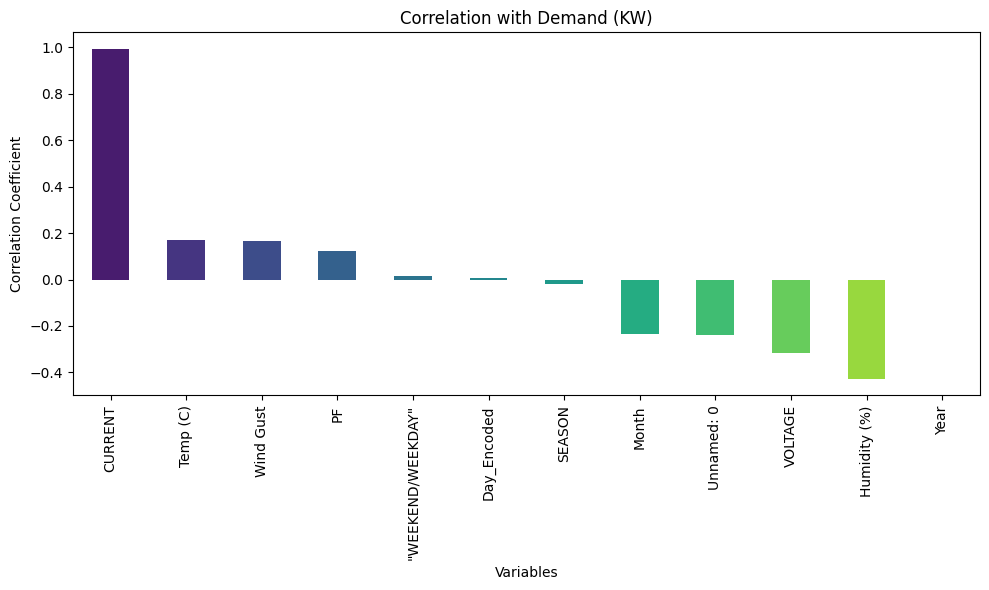

In [ ]:
correlation_with_demand = df.corr(numeric_only=True)['Demand(KW)'].sort_values(ascending=False)
print("\nCorrelation of all numeric variables with 'Demand(KW)':")
print(correlation_with_demand)
plt.figure(figsize=(10, 6))
correlation_with_demand.drop('Demand(KW)').plot(kind='bar', color=sns.color_palette("viridis", len(correlation_with_demand)-1))
plt.title('Correlation with Demand (KW)')
plt.xlabel('Variables')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,Demand(KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,2021-01-01,1,18.333333,5
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,2021-01-01,1,18.333333,5
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,90,10.799999,2021,Friday,2021-01-01,1,18.333333,5
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,49,7.920000,2021,Friday,2021-01-01,1,25.555556,5
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,49,6.479999,2021,Friday,2021-01-01,1,25.555556,5


check the column demad is startionary or not

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(df['Demand(KW)'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

# Interpret the results
if result[1] <= 0.05:
    print("\nReject the null hypothesis (H0). The data is stationary.")
else:
    print("\nFail to reject the null hypothesis (H0). The data is not stationary.")


ADF Statistic: -4.551621
p-value: 0.000158
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567

Reject the null hypothesis (H0). The data is stationary.


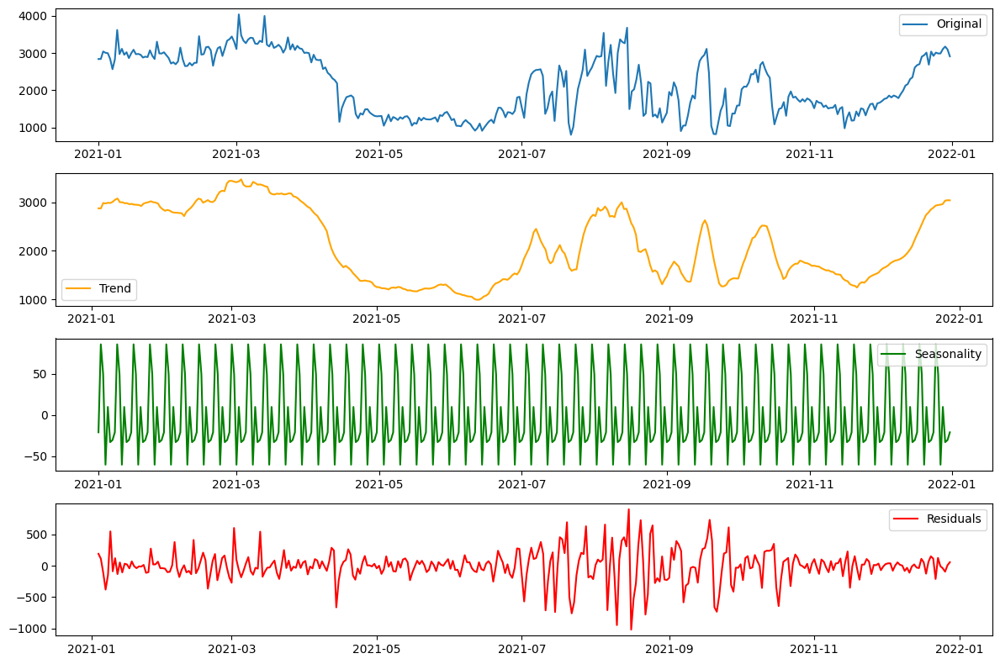

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Ensure 'DATE' is datetime
df['DATE'] = pd.to_datetime(df['DATE'])

# Set 'DATE' as index
df_demand = df.set_index('DATE')[['Demand(KW)']]

# Resample to daily frequency (mean) and handle missing values
df_demand = df_demand.resample('D').mean().fillna(method='ffill')

# Decompose the Demand(KW) time series
decomposition = seasonal_decompose(df_demand['Demand(KW)'], model='additive')  # or 'multiplicative'

# Extract components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot decomposition
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df_demand['Demand(KW)'], label='Original')
plt.legend(loc='best')

plt.subplot(412)
plt.plot(trend, label='Trend', color='orange')
plt.legend(loc='best')

plt.subplot(413)
plt.plot(seasonal, label='Seasonality', color='green')
plt.legend(loc='best')

plt.subplot(414)
plt.plot(residual, label='Residuals', color='red')
plt.legend(loc='best')

plt.tight_layout()
plt.show()

# Reindex components to match original dataframe if needed
trend = trend.reindex(df.index)
seasonal = seasonal.reindex(df.index)
residual = residual.reindex(df.index)

# Add decomposed components to original dataframe
df['Demand_Trend'] = trend.values
df['Demand_Seasonal'] = seasonal.values
df['Demand_Residual'] = residual.values

In [ ]:
df = df.drop(columns=['Demand_Trend', 'Demand_Seasonal', 'Demand_Residual'])
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,Demand(KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,2021-01-01,1,18.333333,5
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,2021-01-01,1,18.333333,5
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,90,10.799999,2021,Friday,2021-01-01,1,18.333333,5
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,49,7.920000,2021,Friday,2021-01-01,1,25.555556,5
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,49,6.479999,2021,Friday,2021-01-01,1,25.555556,5


# **Naive Forecast**

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.dates as mdates

# === Load and Prepare Data ===
df['DATE'] = pd.to_datetime(df['DATE'], format='%d-%m-%Y %H:%M')
df = df.sort_values('DATE')
demand_series = df.set_index('DATE')['Demand(KW)'].dropna()

# === 1. Split into Train, Validation, Test ===
train_size = int(0.6 * len(demand_series))
val_size = int(0.2 * len(demand_series))

train = demand_series[:train_size]
val = demand_series[train_size:train_size + val_size]
test = demand_series[train_size + val_size:]

# === 2. Naive Forecast (previous time step) ===
# Train
train_pred = train.shift(1).dropna()
train_true = train[1:]

# Validation
val_preds = val.shift(1).dropna()
val_true = val[1:]

# Test
test_preds = test.shift(1).dropna()
test_true = test[1:]

# === 3. Evaluation Metrics Function ===
def evaluate_forecast(true, pred, name):
    mae = mean_absolute_error(true, pred)
    mse = mean_squared_error(true, pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(true, pred)
    print(f"\n{name} Set Metrics:")
    print(f"MAE: {mae:.4f}, MSE: {mse:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")
    return true, pred

print("=== Naive Forecasting Evaluation ===")
y_train_true, y_train_pred = evaluate_forecast(train_true, train_pred, "Train")
y_val_true, y_val_pred = evaluate_forecast(val_true, val_preds, "Validation")
y_test_true, y_test_pred = evaluate_forecast(test_true, test_preds, "Test")

# === 4. Forecast Next 24 Hours ===
last_value = demand_series.iloc[-1]
future_dates = pd.date_range(start=demand_series.index[-1] + pd.Timedelta(hours=1), periods=24, freq='H')
future_preds = pd.Series([last_value] * 24, index=future_dates)

print("\n=== Naive Forecast for the Next 24 Hours ===")
for date, pred in zip(future_preds.index, future_preds.values):
    print(f"Date: {date}, Predicted Demand(KW): {pred:.4f}")


=== Naive Forecasting Evaluation ===

Train Set Metrics:
MAE: 727.4550, MSE: 1493013.7761, RMSE: 1221.8894, R²: 0.2487

Validation Set Metrics:
MAE: 671.3993, MSE: 1286016.4528, RMSE: 1134.0267, R²: 0.0724

Test Set Metrics:
MAE: 560.9199, MSE: 912084.2463, RMSE: 955.0310, R²: 0.0928

=== Naive Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 839.8368
Date: 2021-12-31 12:00:00, Pred

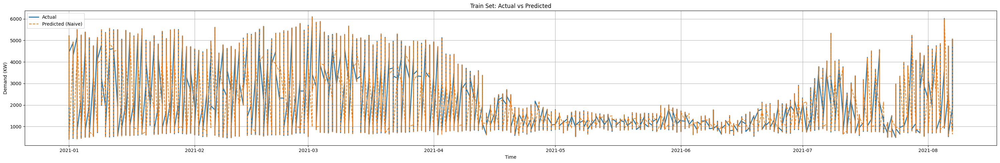

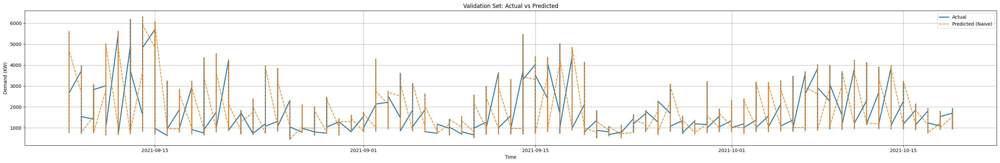

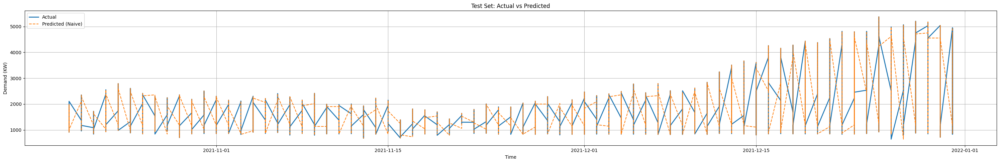

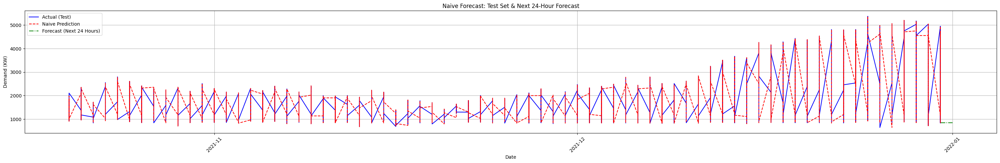

In [ ]:
# === 5. Plot Function ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 5))
    plt.plot(y_true.index, y_true.values, label='Actual', linewidth=2)
    plt.plot(y_pred.index, y_pred.values, label='Predicted (Naive)', linestyle='--')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# === 6. Actual vs Predicted Plots ===
plot_actual_vs_predicted(y_train_true, y_train_pred, "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred, "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred, "Test Set: Actual vs Predicted")

# === 7. Forecast Plot ===
plt.figure(figsize=(30, 5))
plt.plot(y_test_true.index, y_test_true, label='Actual (Test)', color='blue')
plt.plot(y_test_pred.index, y_test_pred, label='Naive Prediction', linestyle='--', color='red')
plt.plot(future_preds.index, future_preds.values, label='Forecast (Next 24 Hours)', linestyle='-.', color='green')
plt.xlabel('Date')
plt.ylabel('Demand (KW)')
plt.title('Naive Forecast: Test Set & Next 24-Hour Forecast')
plt.legend()
plt.grid(True)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

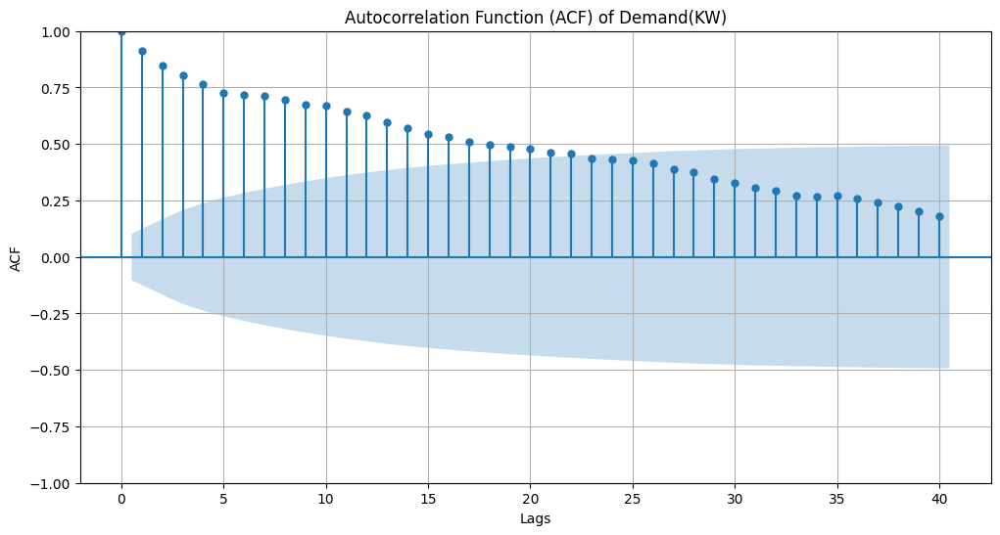

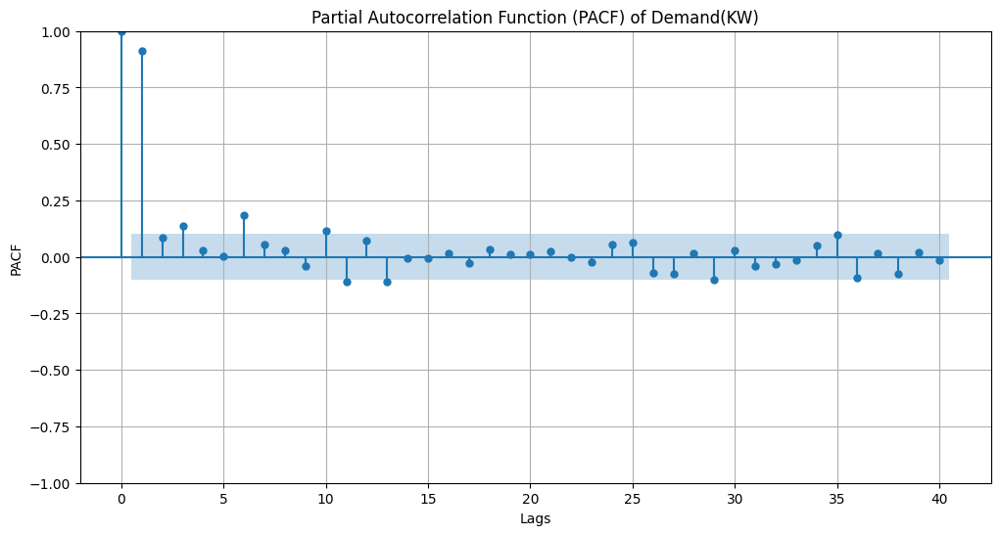

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Plot ACF
plt.figure(figsize=(12, 6))
plot_acf(df_demand['Demand(KW)'].dropna(), lags=40, ax=plt.gca()) # Drop NaNs if any
plt.title('Autocorrelation Function (ACF) of Demand(KW)')
plt.xlabel('Lags')
plt.ylabel('ACF')
plt.grid(True)
plt.show()
# Plot PACF
plt.figure(figsize=(12, 6))
plot_pacf(df_demand['Demand(KW)'].dropna(), lags=40, ax=plt.gca()) # Drop NaNs if any
plt.title('Partial Autocorrelation Function (PACF) of Demand(KW)')
plt.xlabel('Lags')
plt.ylabel('PACF')
plt.grid(True)
plt.show()

Conclusion: Since the ACF does not suggest a clear cut-off (ruling out MA), and PACF shows significance at lag 1 only, we choose to apply an AR(1) model for forecasting the electric load.

# AR(1)

In [ ]:
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,Demand(KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,2021-01-01,1,18.333333,5
19,19,2021-01-01,20-00,11.8,39,0.96,765.206190,0,1,88,11.159999,2021,Friday,2021-01-01,1,18.888889,5
18,18,2021-01-01,19-00,11.8,42,0.96,824.068205,0,1,88,11.159999,2021,Friday,2021-01-01,1,18.888889,5
17,17,2021-01-01,18-00,11.7,44,0.96,855.993366,0,1,87,11.879999,2021,Friday,2021-01-01,1,19.444444,5
11,11,2021-01-01,12-00,11.5,243,0.96,4646.607342,0,1,42,13.320000,2021,Friday,2021-01-01,1,27.222222,5


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.dates as mdates

# === 0. Load & Preprocess ===
# Assuming `df` is already loaded
# === 0. Preprocessing to fix '24-00' ===
mask_24 = df['TIME'] == '24-00'
df.loc[mask_24, 'TIME'] = '00-00'
df.loc[mask_24, 'DATE'] = pd.to_datetime(df.loc[mask_24, 'DATE']) + pd.Timedelta(days=1)

# Combine into datetime
df['datetime'] = pd.to_datetime(df['DATE'].astype(str) + ' ' + df['TIME'].str.replace('-', ':'), format='%Y-%m-%d %H:%M')

df = df.sort_values('datetime')
df = df.set_index('datetime').asfreq('H')  # Ensure datetime index is hourly
demand_series = df['Demand(KW)'].dropna()

# === 1. Train/Val/Test Split ===
train_size = int(0.6 * len(demand_series))
val_size = int(0.2 * len(demand_series))
train = demand_series[:train_size]
val = demand_series[train_size:train_size + val_size]
test = demand_series[train_size + val_size:]

# === 2. Fit AR(1) on Train Set ===
model_train = ARIMA(train.dropna(), order=(1, 0, 0)).fit()
train_pred = model_train.fittedvalues
train_true = train.dropna()[train_pred.index]

# === 3. Rolling Forecast on Validation Set ===
val_preds = []
current_train = train.copy()

for t in range(len(val)):
    model = ARIMA(current_train.dropna(), order=(1, 0, 0)).fit()
    pred = model.forecast(steps=1)
    val_preds.append(pred.iloc[0])
    current_train = pd.concat([current_train, pd.Series([val.iloc[t]], index=[val.index[t]])])

val_preds = pd.Series(val_preds, index=val.index)

# === 4. Rolling Forecast on Test Set ===
test_preds = []
current_train = pd.concat([train, val])

for t in range(len(test)):
    model = ARIMA(current_train.dropna(), order=(1, 0, 0)).fit()
    pred = model.forecast(steps=1)
    test_preds.append(pred.iloc[0])
    current_train = pd.concat([current_train, pd.Series([test.iloc[t]], index=[test.index[t]])])

test_preds = pd.Series(test_preds, index=test.index)

# === 5. Evaluation Metrics ===
mae_train = mean_absolute_error(train_true, train_pred)
mse_train = mean_squared_error(train_true, train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score(train_true, train_pred)

mae_val = mean_absolute_error(val, val_preds)
mse_val = mean_squared_error(val, val_preds)
rmse_val = np.sqrt(mse_val)
r2_val = r2_score(val, val_preds)

mae_test = mean_absolute_error(test, test_preds)
mse_test = mean_squared_error(test, test_preds)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(test, test_preds)

print("=== AR(1) Model Evaluation for Demand(KW) ===")
print(f"Train Set  -> MAE: {mae_train:.4f}, MSE: {mse_train:.4f}, RMSE: {rmse_train:.4f}, R²: {r2_train:.4f}")
print(f"Val Set    -> MAE: {mae_val:.4f}, MSE: {mse_val:.4f}, RMSE: {rmse_val:.4f}, R²: {r2_val:.4f}")
print(f"Test Set   -> MAE: {mae_test:.4f}, MSE: {mse_test:.4f}, RMSE: {rmse_test:.4f}, R²: {r2_test:.4f}")

# === 6. Forecast for Next 24 Hours ===
last_index = demand_series.index[-1]
future_dates = pd.date_range(start=last_index + pd.Timedelta(hours=1), periods=24, freq='H')
future_preds = []
current_data = pd.concat([train, val, test])

for i in range(24):
    model = ARIMA(current_data.dropna(), order=(1, 0, 0)).fit()
    pred = model.forecast(steps=1)
    future_preds.append(pred.iloc[0])
    current_data = pd.concat([current_data, pd.Series([pred.iloc[0]], index=[future_dates[i]])])

future_preds = pd.Series(future_preds, index=future_dates)

# === 7. Forecast Output ===
print("\n=== AR(1) Forecast for Next 24 Hours ===")
for dt, pred in future_preds.items():
    print(f"Date: {dt}, Predicted Demand(KW): {pred:.4f}")

=== AR(1) Model Evaluation for Demand(KW) ===
Train Set  -> MAE: 315.4796, MSE: 335065.0214, RMSE: 578.8480, R²: 0.8314
Val Set    -> MAE: 268.3707, MSE: 232863.4218, RMSE: 482.5592, R²: 0.8327
Test Set   -> MAE: 220.4906, MSE: 180451.4769, RMSE: 424.7958, R²: 0.8204

=== AR(1) Forecast for Next 24 Hours ===
Date: 2022-01-01 01:00:00, Predicted Demand(KW): 952.7398
Date: 2022-01-01 02:00:00, Predicted Demand(KW): 1055.7508
Date: 2022-01-01 03:00:00, Predicted Demand(KW): 1149.7364
Date: 2022-01-01 04:00:00, Predicted Demand(KW): 1235.4873
Date: 2022-01-01 05:00:00, Predicted Demand(KW): 1313.7251
Date: 2022-01-01 06:00:00, Predicted Demand(KW): 1385.1081
Date: 2022-01-01 07:00:00, Predicted Demand(KW): 1450.2368
Date: 2022-01-01 08:00:00, Predicted Demand(KW): 1509.6591
Date: 2022-01-01 09:00:00, Predicted Demand(KW): 1563.8752
Date: 2022-01-01 10:00:00, Predicted Demand(KW): 1613.3410
Date: 2022-01-01 11:00:00, Predicted Demand(KW): 1658.4729
Date: 2022-01-01 12:00:00, Predicted Deman

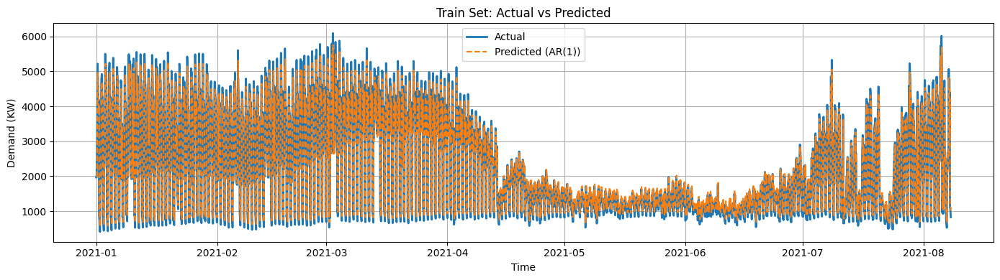

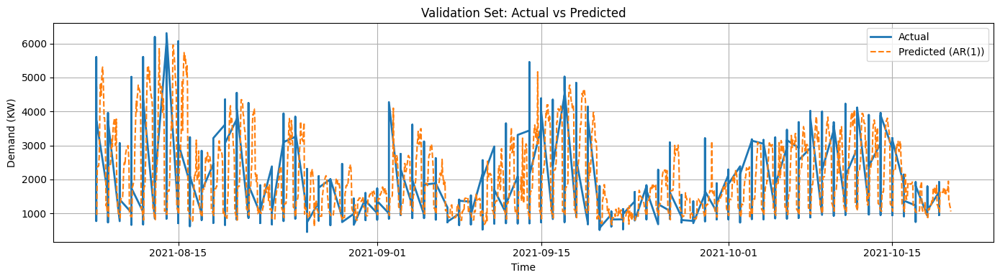

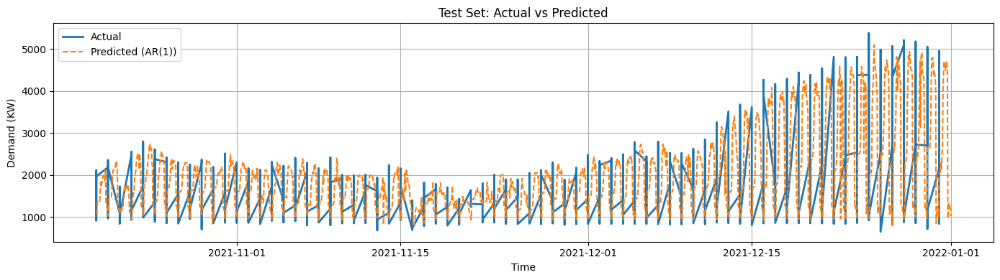

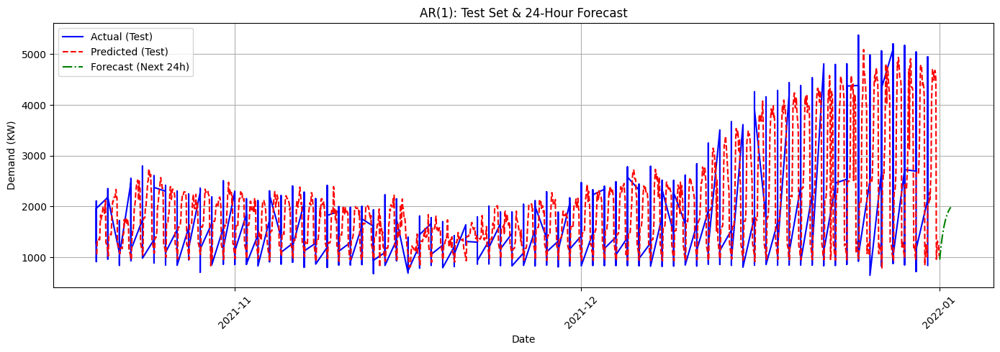

In [ ]:

# === 8. Plot Actual vs Predicted ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(14, 4))
    plt.plot(y_true.index, y_true.values, label='Actual', linewidth=2)
    plt.plot(y_pred.index, y_pred.values, label='Predicted (AR(1))', linestyle='--')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plot_actual_vs_predicted(train_true, train_pred[1:], "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(val_true, val_preds, "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(test_true, test_preds, "Test Set: Actual vs Predicted")

# === 9. Forecast Plot for Test + Future ===
plt.figure(figsize=(14, 5))
plt.plot(test_true.index, test_true.values, label='Actual (Test)', color='blue')
plt.plot(test_preds.index, test_preds.values, label='Predicted (Test)', linestyle='--', color='red')
plt.plot(future_preds.index, future_preds.values, label='Forecast (Next 24h)', linestyle='-.', color='green')
plt.xlabel('Date')
plt.ylabel('Demand (KW)')
plt.title('AR(1): Test Set & 24-Hour Forecast')
plt.legend()
plt.grid(True)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# Quantile regression

In [ ]:
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,Demand(KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded,Demand_Trend,Demand_Seasonal,Demand_Residual
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,2021-01-01,1,18.333333,5,NaN,NaN,NaN
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,2021-01-01,1,18.333333,5,NaN,NaN,NaN
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,90,10.799999,2021,Friday,2021-01-01,1,18.333333,5,NaN,NaN,NaN
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,49,7.920000,2021,Friday,2021-01-01,1,25.555556,5,NaN,NaN,NaN
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,49,6.479999,2021,Friday,2021-01-01,1,25.555556,5,NaN,NaN,NaN


In [ ]:
import statsmodels.formula.api as smf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from datetime import datetime, timedelta

# Feature engineering
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)
df['rolling_mean_24'] = df['Demand(KW)'].rolling(window=24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(window=168, min_periods=1).mean()

# Drop rows with NaN values (due to lags)
df.dropna(inplace=True)

# Select specified features
features = ['Demand(KW)', 'Temp (C)', 'Wind Gust', 'PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
df = df[features]

print(f"DataFrame shape after preprocessing: {df.shape}")

# Create sequences for quantile regression
def create_sequences(X, y, time_steps=24):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X.iloc[i:(i + time_steps)][features].values.flatten())  # Flatten to 2D
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

X, y = df[features], df['Demand(KW)']
X_seq, y_seq = create_sequences(X, y.values, time_steps=24)
print(f"X_seq shape: {X_seq.shape}, y_seq shape: {y_seq.shape}")

# Check if sequences are empty
if X_seq.size == 0:
    raise ValueError("No sequences generated. Dataset is too small for time_steps=24 and lag_168. Try reducing time_steps or lags.")

# Train/validation/test split (60/20/20)
train_size = int(len(X_seq) * 0.6)
val_size = int(len(X_seq) * 0.2)
X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val = X_seq[train_size:train_size + val_size], y_seq[train_size:train_size + val_size]
X_test, y_test = X_seq[train_size + val_size:], y_seq[train_size + val_size:]

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}, y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")

# Scale features and target
scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# === Quantile Regression Model ===
def build_model(quantile, X_train, y_train):
    feature_names = [f'f{i}' for i in range(X_train.shape[1])]
    train_df = pd.DataFrame(X_train, columns=feature_names)
    train_df['y'] = y_train
    formula = 'y ~ ' + ' + '.join(feature_names)
    model = smf.quantreg(formula, data=train_df)
    result = model.fit(q=quantile)
    return result

# Hyperparameter tuning (quantile levels)
quantiles = [0.25, 0.5, 0.75]
results = {}
val_losses = {}
for q in quantiles:
    model = build_model(q, X_train_scaled, y_train_scaled)
    results[q] = model
    # Compute validation loss (MSE)
    y_pred_scaled = model.predict(pd.DataFrame(X_val_scaled, columns=[f'f{i}' for i in range(X_val_scaled.shape[1])]))
    mse = mean_squared_error(y_val_scaled, y_pred_scaled)
    val_losses[q] = mse
    print(f"\nQuantile {q} Validation MSE: {mse:.4f}")

# Select best quantile
best_quantile = min(val_losses, key=val_losses.get)
print(f"\nBest Quantile: {best_quantile}, Validation MSE: {val_losses[best_quantile]:.4f}")
best_model = results[best_quantile]

# Retrain best model on combined train + validation data
X_train_val_scaled = np.vstack([X_train_scaled, X_val_scaled])
y_train_val_scaled = np.hstack([y_train_scaled, y_val_scaled])
train_val_df = pd.DataFrame(X_train_val_scaled, columns=[f'f{i}' for i in range(X_train_val_scaled.shape[1])])
train_val_df['y'] = y_train_val_scaled
best_model = build_model(best_quantile, X_train_val_scaled, y_train_val_scaled)

# === Evaluation ===
def evaluate_model(model, X, y, scaler_y, set_name):
    X_df = pd.DataFrame(X, columns=[f'f{i}' for i in range(X.shape[1])])
    y_pred_scaled = model.predict(X_df)
    y_pred = scaler_y.inverse_transform(y_pred_scaled.values.reshape(-1, 1)).ravel()
    y_true = scaler_y.inverse_transform(y.reshape(-1, 1)).ravel()
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"\n{set_name} Set Metrics:")
    print(f"MSE: {mse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R²: {r2:.4f}")
    return y_pred

y_train_pred = evaluate_model(best_model, X_train_scaled, y_train_scaled, scaler_y, "Train")
y_val_pred = evaluate_model(best_model, X_val_scaled, y_val_scaled, scaler_y, "Validation")
y_test_pred = evaluate_model(best_model, X_test_scaled, y_test_scaled, scaler_y, "Test")

# === Plot Actual vs Predicted ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(12, 6))
    plt.plot(y_true[:100], label='Actual', linewidth=2)  # Limit to 100 points for clarity
    plt.plot(y_pred[:100], label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
y_val_true = scaler_y.inverse_transform(y_val_scaled.reshape(-1, 1)).ravel()
y_test_true = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

plot_actual_vs_predicted(y_train_true, y_train_pred, f"Train Set: Actual vs Predicted (Quantile {best_quantile})")
plot_actual_vs_predicted(y_val_true, y_val_pred, f"Validation Set: Actual vs Predicted (Quantile {best_quantile})")
plot_actual_vs_predicted(y_test_true, y_test_pred, f"Test Set: Actual vs Predicted (Quantile {best_quantile})")

# === Forecast Next 24 Hours ===
last_sequence = X_seq[-1].reshape(1, -1)  # Last 24 timesteps flattened
last_sequence_scaled = scaler_X.transform(last_sequence)
forecast = []
current_sequence_scaled = last_sequence_scaled

# Use average values for Temp (C), Wind Gust, and PF for forecasting
avg_temp = df['Temp (C)'].mean()
avg_wind_gust = df['Wind Gust'].mean()
avg_pf = df['PF'].mean()

for _ in range(24):
    current_df = pd.DataFrame(current_sequence_scaled, columns=[f'f{i}' for i in range(current_sequence_scaled.shape[1])])
    pred_scaled = best_model.predict(current_df)[0]
    pred = scaler_y.inverse_transform([[pred_scaled]])[0, 0]
    forecast.append(pred)
    # Update sequence with predicted value and average values for other features
    next_features = current_sequence_scaled[0].copy()
    next_features[0] = pred_scaled  # Update Demand(KW)
    # Update Temp (C), Wind Gust, PF with averages for the next timestep
    next_features[1::len(features)] = avg_temp  # Temp (C) for each timestep
    next_features[2::len(features)] = avg_wind_gust  # Wind Gust for each timestep
    next_features[3::len(features)] = avg_pf  # PF for each timestep
    # Update lags and rolling means (simplified)
    next_features[4::len(features)] = pred_scaled  # lag_1
    next_features[5::len(features)] = current_sequence_scaled[0, 5 - len(features)]  # lag_24
    next_features[6::len(features)] = current_sequence_scaled[0, 6 - len(features)]  # lag_168
    next_features[7::len(features)] = np.mean(current_sequence_scaled[0, 0::len(features)] + [pred_scaled])  # rolling_mean_24
    next_features[8::len(features)] = np.mean(current_sequence_scaled[0, 0::len(features)] + [pred_scaled])  # rolling_mean_168
    current_sequence_scaled = np.roll(current_sequence_scaled, -len(features), axis=1)
    current_sequence_scaled[0, -len(features):] = next_features[-len(features):]

# Print forecast
print(f"\n=== Quantile Regression Forecast for the Next 24 Hours (Quantile {best_quantile}) ===")
start_date = datetime(2022, 1, 1, 1)  # Start from 2022-01-01 01:00
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")

# Plot forecast
plt.figure(figsize=(12, 6))
plt.plot(range(24), forecast, label=f'Forecast (Next 24h, Quantile {best_quantile})', color='green')
plt.title('Quantile Regression Forecast for Next 24 Hours')
plt.xlabel('Hour')
plt.ylabel('Demand (KW)')
plt.legend()
plt.grid(True)
plt.show()

# Machine Learning

Decision tree

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from datetime import datetime, timedelta

# === Step 1: Feature & Target ===
feature_cols = ['Temp (C)', 'Wind Gust', 'PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
X = df[feature_cols]
y = df['Demand(KW)']

# === Step 2: Split Data (60/20/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# === Step 3: Scaling ===
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
X_test_scaled = scaler_X.transform(X_test)
X_train_full_scaled = scaler_X.fit_transform(X_train_full)

scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1)).ravel()

# === Step 4: Hyperparameter Tuning ===
param_grid = {
    'max_depth': [5, 10, 15],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [2, 5]
}

grid_search = GridSearchCV(
    estimator=DecisionTreeRegressor(random_state=42),
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=3,
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_scaled, y_train)
best_dt = grid_search.best_estimator_

print("\n✅ Best Hyperparameters:")
print(grid_search.best_params_)

# === Step 5: Evaluation Function ===
def evaluate_model(model, X, y, label):
    preds = model.predict(X)
    mae = mean_absolute_error(y, preds)
    mse = mean_squared_error(y, preds)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y - preds) / y)) * 100
    r2 = r2_score(y, preds)

    print(f"\n📊 {label} Set Performance:")
    print(f"MAE:  {mae:.2f}")
    print(f"MSE:  {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²:   {r2:.4f}")
    return preds

# === Step 6: Evaluate and Get Predictions ===
y_train_pred = evaluate_model(best_dt, X_train_scaled, y_train, "Train")
y_val_pred = evaluate_model(best_dt, X_val_scaled, y_val, "Validation")
y_test_pred = evaluate_model(best_dt, X_test_scaled, y_test, "Test")

# === Step 7: Plot Function ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 6))
    plt.plot(y_true, label='Actual', linewidth=2)
    plt.plot(y_pred, label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

# === Step 8: Inverse Scaling (for plotting in original scale) ===
y_train_true = y_train.values
y_val_true = y_val.values
y_test_true = y_test.values

Fitting 3 folds for each of 12 candidates, totalling 36 fits

✅ Best Hyperparameters:
{'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5}

📊 Train Set Performance:
MAE:  590.13
MSE:  698495.13
RMSE: 835.76
MAPE: 36.33%
R²:   0.6417

📊 Validation Set Performance:
MAE:  666.69
MSE:  851365.87
RMSE: 922.69
MAPE: 40.39%
R²:   0.3620

📊 Test Set Performance:
MAE:  645.25
MSE:  810730.92
RMSE: 900.41
MAPE: 33.61%
R²:   0.2044


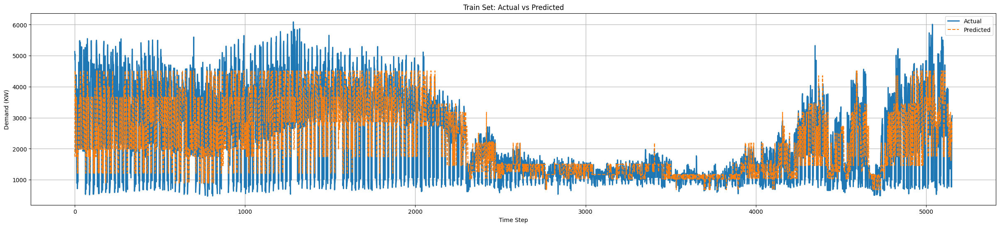

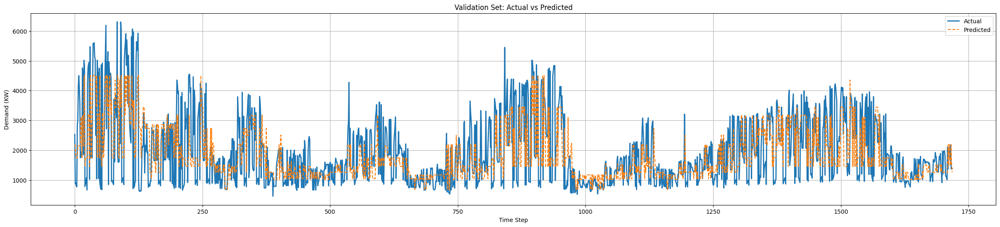

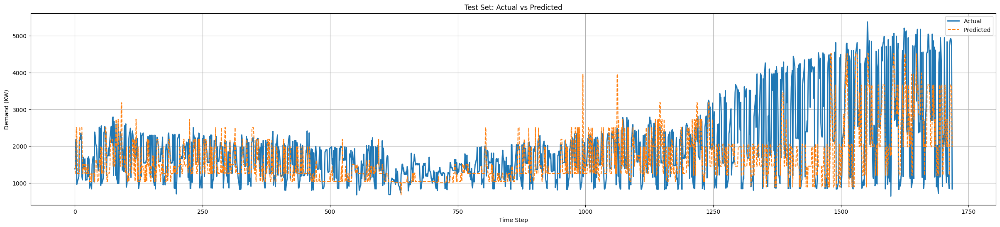


=== 🌤️ Decision Tree Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 2729.7600
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 3661.8867
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 3661.8867
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 3661.8867
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 1979.8691
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 1211.2326
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 1979.8691
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 1979.8691
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 2863.8540
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 3661.8867
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 2863.8540
Date: 2021-12-31 12:00:00, Predicted Demand(KW): 1979.8691
Date: 2021-12-31 13:00:00, Predicted Demand(KW): 2054.4919
Date: 2021-12-31 14:00:00, Predicted Demand(KW): 2729.7600
Date: 2021-12-31 15:00:00, Predicted Demand(KW): 1979.8691
Date: 2021-12-31 16:00:00, Predicted Demand(KW): 2054.4919

In [ ]:
plot_actual_vs_predicted(y_train_true, y_train_pred, "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred, "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred, "Test Set: Actual vs Predicted")

# === Step 9: 24-Hour Forecast ===
X_forecast_input = X.iloc[-24:]
X_forecast_scaled = scaler_X.transform(X_forecast_input)
forecast = best_dt.predict(X_forecast_scaled)

print("\n=== 🌤️ Decision Tree Forecast for the Next 24 Hours ===")
start_date = datetime(2021, 12, 31, 1)  # update accordingly
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")


Random forest

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from datetime import datetime, timedelta

# === Feature Engineering: Re-create necessary lag and rolling mean features ===
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)
df['rolling_mean_24'] = df['Demand(KW)'].rolling(window=24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(window=168, min_periods=1).mean()

# Drop rows with NaN values created by the shifts
df.dropna(inplace=True)


# === Step 1: Feature & Target ===
feature_cols = ['Temp (C)', 'Wind Gust', 'PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
X = df[feature_cols]
y = df['Demand(KW)']

# === Step 2: Split Data (60/20/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# === Step 3: Scaling ===
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
X_test_scaled = scaler_X.transform(X_test)
X_train_full_scaled = scaler_X.fit_transform(X_train_full)

# Target scaler (optional if needed for plotting forecast in original scale)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1)).ravel()

# === Step 4: Hyperparameter Tuning ===
param_grid = {
    'n_estimators': [100, 150],
    'max_depth': [5, 10],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [3, 5],
    'max_features': ['sqrt']
}

grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=3,
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_scaled, y_train)
best_rf = grid_search.best_estimator_

print("\n✅ Best Hyperparameters:")
print(grid_search.best_params_)

# === Step 5: Evaluation Function ===
def evaluate_model(model, X, y, label):
    preds = model.predict(X)
    mae = mean_absolute_error(y, preds)
    mse = mean_squared_error(y, preds)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y - preds) / y)) * 100
    r2 = r2_score(y, preds)

    print(f"\n📊 {label} Set Performance:")
    print(f"MAE:  {mae:.2f}")
    print(f"MSE:  {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²:   {r2:.4f}")
    return preds

# === Step 6: Evaluate and Get Predictions ===
y_train_pred = evaluate_model(best_rf, X_train_scaled, y_train, "Train")
y_val_pred = evaluate_model(best_rf, X_val_scaled, y_val, "Validation")
y_test_pred = evaluate_model(best_rf, X_test_scaled, y_test, "Test")

# === Step 7: Plot Function ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 6))
    plt.plot(y_true.reset_index(drop=True), label='Actual', linewidth=2) # Reset index for plotting
    plt.plot(y_pred, label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

# === Step 8: Inverse Scaling (for plotting in original scale) ===
y_train_true = y_train
y_val_true = y_val
y_test_true = y_test

Fitting 3 folds for each of 16 candidates, totalling 48 fits

✅ Best Hyperparameters:
{'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 150}

📊 Train Set Performance:
MAE:  427.38
MSE:  354591.24
RMSE: 595.48
MAPE: 27.11%
R²:   0.8160

📊 Validation Set Performance:
MAE:  572.54
MSE:  624794.36
RMSE: 790.44
MAPE: 34.62%
R²:   0.4700

📊 Test Set Performance:
MAE:  579.21
MSE:  653269.87
RMSE: 808.25
MAPE: 29.49%
R²:   0.3658


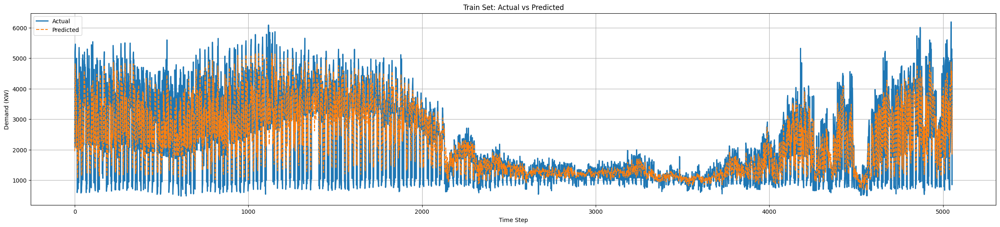

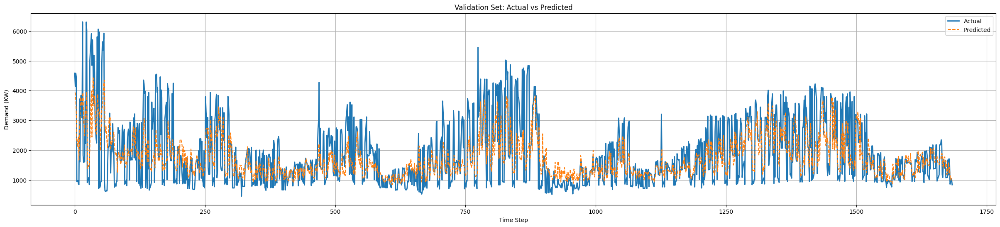

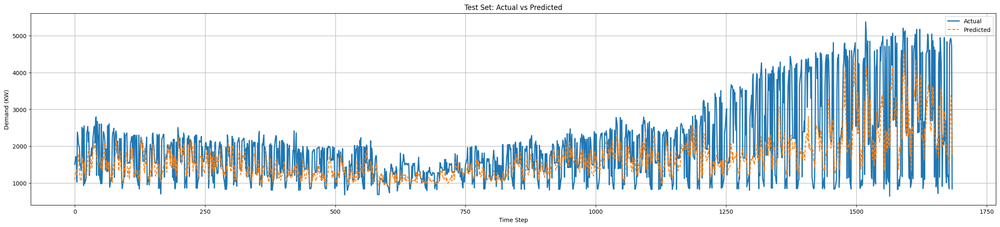


=== 🌤️ Random Forest Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 3125.0034
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 3857.6086
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 3657.4162
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 3529.0569
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 2224.0354
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 1825.5261
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 2165.4479
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 2092.8422
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 2879.2067
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 3361.6588
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 2723.1828
Date: 2021-12-31 12:00:00, Predicted Demand(KW): 2139.9774
Date: 2021-12-31 13:00:00, Predicted Demand(KW): 1844.4408
Date: 2021-12-31 14:00:00, Predicted Demand(KW): 1810.9194
Date: 2021-12-31 15:00:00, Predicted Demand(KW): 1941.8026
Date: 2021-12-31 16:00:00, Predicted Demand(KW): 1759.9940

In [ ]:
plot_actual_vs_predicted(y_train_true, y_train_pred, "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred, "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred, "Test Set: Actual vs Predicted")

# === Step 9: 24-Hour Forecast ===
# Forecast next 24 hours based on last 24 rows of full training data
X_forecast_input = X.iloc[-24:]
X_forecast_scaled = scaler_X.transform(X_forecast_input)
forecast = best_rf.predict(X_forecast_scaled)

print("\n=== 🌤️ Random Forest Forecast for the Next 24 Hours ===")
start_date = datetime(2021, 12, 31, 1)  # update as per your last timestamp
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")


Xgboost

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from datetime import datetime, timedelta
import xgboost as xgb

# === Step 1: Feature & Target ===
feature_cols = ['Temp (C)', 'Wind Gust', 'PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
X = df[feature_cols]
y = df['Demand(KW)']

# === Step 2: Split Data (60/20/20) ===
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# === Step 3: Scaling ===
# (Optional for XGBoost, but retained for consistency and comparison)
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_val_scaled = scaler_X.transform(X_val)
X_test_scaled = scaler_X.transform(X_test)
X_train_full_scaled = scaler_X.fit_transform(X_train_full)

scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1)).ravel()

# === Step 4: Hyperparameter Tuning ===
param_grid = {
    'n_estimators': [100, 150],
    'max_depth': [3, 5],
    'learning_rate': [0.05, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(objective='reg:squarederror', random_state=42),
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=3,
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train_scaled, y_train)
best_xgb = grid_search.best_estimator_

print("\n✅ Best Hyperparameters:")
print(grid_search.best_params_)

# === Step 5: Evaluation Function ===
def evaluate_model(model, X, y, label):
    preds = model.predict(X)
    mae = mean_absolute_error(y, preds)
    mse = mean_squared_error(y, preds)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y - preds) / y)) * 100
    r2 = r2_score(y, preds)

    print(f"\n📊 {label} Set Performance:")
    print(f"MAE:  {mae:.2f}")
    print(f"MSE:  {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²:   {r2:.4f}")
    return preds

# === Step 6: Evaluate and Get Predictions ===
y_train_pred = evaluate_model(best_xgb, X_train_scaled, y_train, "Train")
y_val_pred = evaluate_model(best_xgb, X_val_scaled, y_val, "Validation")
y_test_pred = evaluate_model(best_xgb, X_test_scaled, y_test, "Test")

# === Step 7: Plot Function ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 6))
    plt.plot(y_true, label='Actual', linewidth=2)
    plt.plot(y_pred, label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

# === Step 8: Inverse Scaling (for plotting in original scale) ===
y_train_true = y_train.values
y_val_true = y_val.values
y_test_true = y_test.values


Fitting 3 folds for each of 32 candidates, totalling 96 fits

✅ Best Hyperparameters:
{'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}

📊 Train Set Performance:
MAE:  540.59
MSE:  565844.31
RMSE: 752.23
MAPE: 33.75%
R²:   0.7063

📊 Validation Set Performance:
MAE:  596.59
MSE:  672727.44
RMSE: 820.20
MAPE: 33.30%
R²:   0.4294

📊 Test Set Performance:
MAE:  602.43
MSE:  679925.60
RMSE: 824.58
MAPE: 30.64%
R²:   0.3399


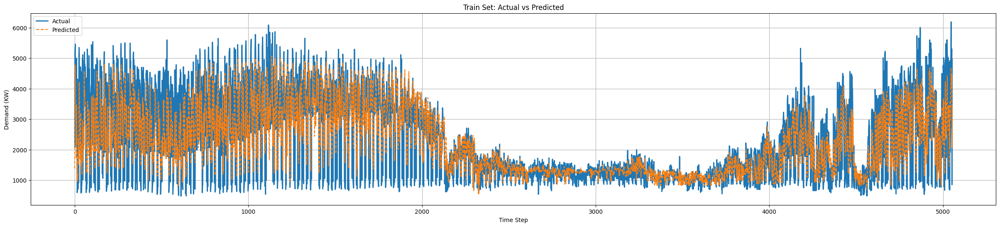

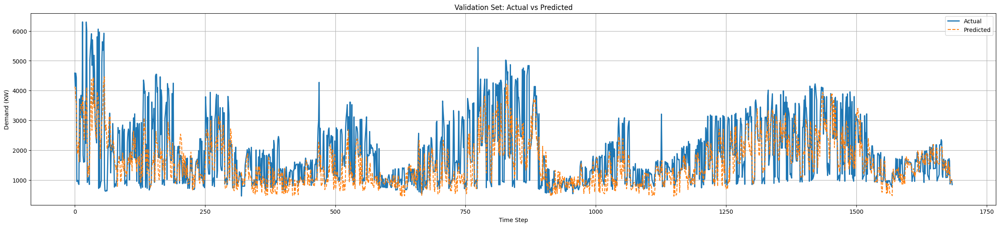

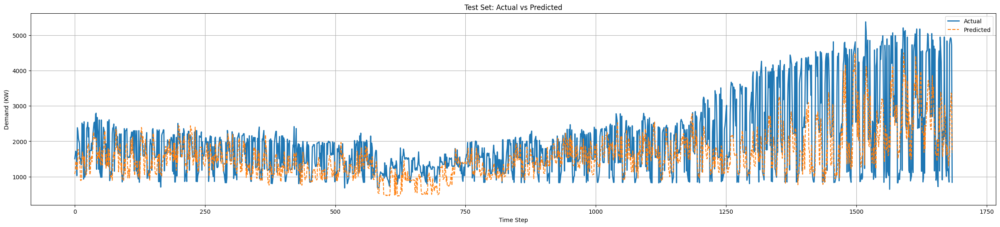


=== 🌤️ XGBoost Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 2927.3555
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 3736.1384
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 3400.2134
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 3288.5571
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 1693.4423
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 1272.6919
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 1690.5596
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 1690.5596
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 2906.1726
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 3450.5190
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 2745.5046
Date: 2021-12-31 12:00:00, Predicted Demand(KW): 1989.9303
Date: 2021-12-31 13:00:00, Predicted Demand(KW): 1470.9661
Date: 2021-12-31 14:00:00, Predicted Demand(KW): 1847.3250
Date: 2021-12-31 15:00:00, Predicted Demand(KW): 1911.7529
Date: 2021-12-31 16:00:00, Predicted Demand(KW): 1457.6508
Date:

In [ ]:

plot_actual_vs_predicted(y_train_true, y_train_pred, "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred, "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred, "Test Set: Actual vs Predicted")

# === Step 9: 24-Hour Forecast ===
X_forecast_input = X.iloc[-24:]
X_forecast_scaled = scaler_X.transform(X_forecast_input)
forecast = best_xgb.predict(X_forecast_scaled)

print("\n=== 🌤️ XGBoost Forecast for the Next 24 Hours ===")
start_date = datetime(2021, 12, 31, 1)  # update accordingly
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")


# rnn


In [ ]:
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,Demand(KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,2021-01-01,1,18.333333,5
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,2021-01-01,1,18.333333,5
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,90,10.799999,2021,Friday,2021-01-01,1,18.333333,5
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,49,7.920000,2021,Friday,2021-01-01,1,25.555556,5
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,49,6.479999,2021,Friday,2021-01-01,1,25.555556,5


In [ ]:
# Ensure TIME is string
df['TIME'] = df['TIME'].astype(str)

# Fix TIME format: "01-00" -> "01:00"
df['TIME'] = df['TIME'].str.replace('-', ':')

def fix_date_time(row):
    date_str = row['DATE'].strftime('%Y-%m-%d')
    time_str = row['TIME']

    # If time is "24:00" → shift to next day
    if time_str == "24:00":
        new_date = (row['DATE'] + pd.Timedelta(days=1)).strftime('%Y-%m-%d')
        return new_date + " 00:00"

    # Normal case
    return date_str + " " + time_str

# Create final datetime string
df['DATETIME_STR'] = df.apply(fix_date_time, axis=1)

# Convert to datetime
df['Datetime'] = pd.to_datetime(df['DATETIME_STR'])

# Set index
df = df.set_index('Datetime')
df = df.sort_index()

# Clean up
df.drop(columns=['DATETIME_STR'], inplace=True)


In [ ]:
pip install tensorflow

In [ ]:
df.head()

,Unnamed: 0,DATE,TIME,VOLTAGE,CURRENT,PF,Demand(KW),"""WEEKEND/WEEKDAY""",SEASON,Humidity (%),Wind Gust,Year,Day Name,Day,Month,Temp (C),Day_Encoded,Demand_Trend,Demand_Seasonal,Demand_Residual
0,0,2021-01-01,01-00,11.6,102,0.96,1967.388015,0,1,90,13.679999,2021,Friday,2021-01-01,1,18.333333,5,NaN,NaN,NaN
1,1,2021-01-01,02-00,11.6,102,0.96,1967.388015,0,1,90,12.599999,2021,Friday,2021-01-01,1,18.333333,5,NaN,NaN,NaN
2,2,2021-01-01,03-00,11.6,102,0.96,1967.388015,0,1,90,10.799999,2021,Friday,2021-01-01,1,18.333333,5,NaN,NaN,NaN
3,3,2021-01-01,04-00,11.3,130,0.96,2442.607331,0,1,49,7.920000,2021,Friday,2021-01-01,1,25.555556,5,NaN,NaN,NaN
4,4,2021-01-01,05-00,11.2,148,0.96,2756.205522,0,1,49,6.479999,2021,Friday,2021-01-01,1,25.555556,5,NaN,NaN,NaN


In [ ]:
pip install keras-tuner --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 kB 4.1 MB/s eta 0:00:00


In [ ]:
import random
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
from kerastuner.tuners import RandomSearch
from datetime import datetime, timedelta

Reloading Tuner from rnn_tuning_dir/electricity_rnn/tuner0.json

Best Hyperparameters:
units1: 128
l2_reg: 0.001
dropout1: 0.2
units2: 32
dropout2: 0.3
lr: 0.001
Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.5468 - val_loss: 0.0937
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1659 - val_loss: 0.0832
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1167 - val_loss: 0.0779
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0974 - val_loss: 0.0742
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0884 - val_loss: 0.0663
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0806 - val_loss: 0.0639
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0760 - val_loss: 0.0627
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0708 - val_loss: 0.0583
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0663 - val_loss: 0.0560
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0643 - val_

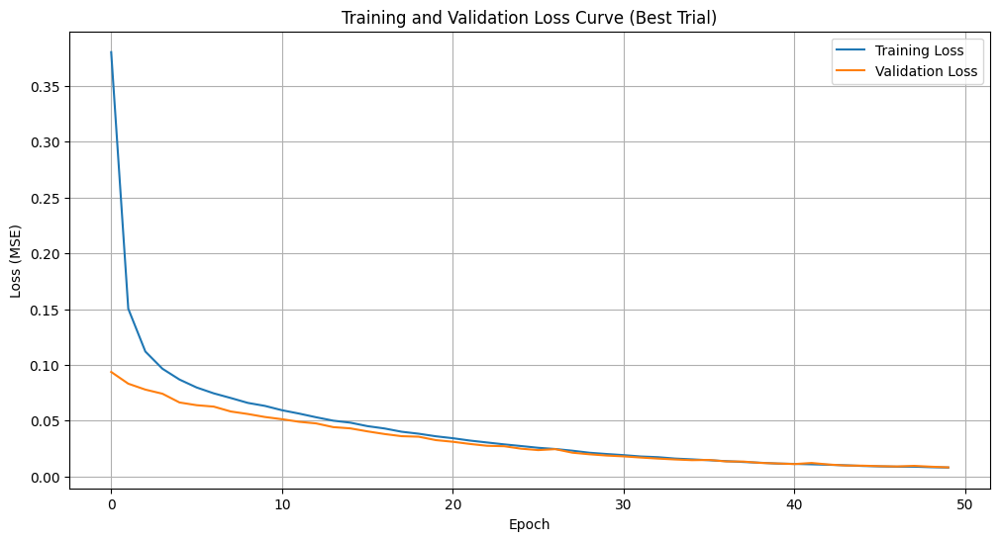


=== Vanilla RNN Model Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 1952.4895
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 1809.8700
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 1809.0176
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 1954.1290
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 2374.4463
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 2845.0273
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 3213.4783
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 3833.6538
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 3983.6550
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 4296.9902
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 4542.2441
Date: 2021-12-31 12:00:00, Predicted Demand(KW): 4958.1138
Date: 2021-12-31 13:00:00, Predicted Demand(KW): 4606.1909
Date: 2021-12-31 14:00:00, Predicted Demand(KW): 4398.5156
Date: 2021-12-31 15:00:00, Predicted Demand(KW): 4583.0796
Date: 2021-12-31 16:00:00, Predicted Demand(KW): 4560.318

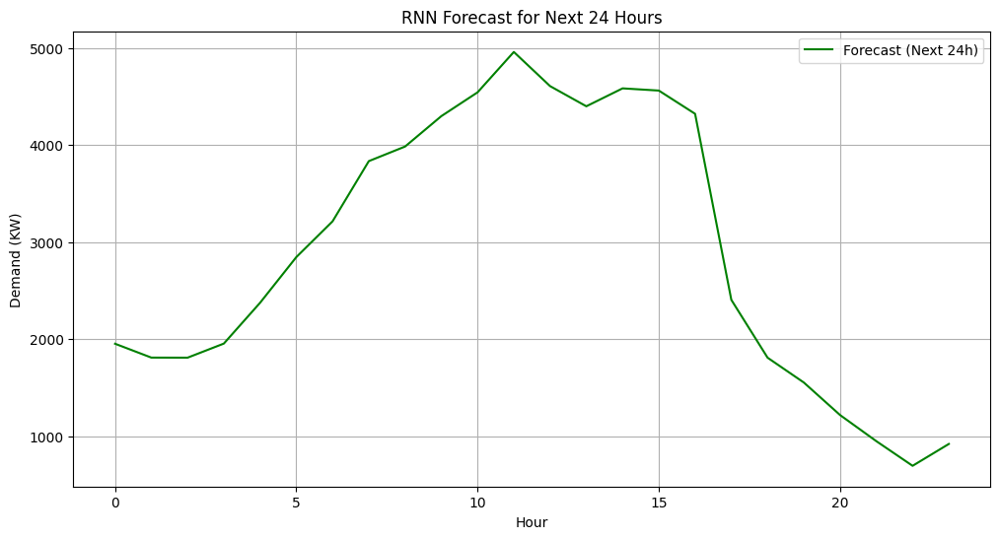

In [ ]:
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
# === Data Preparation (unchanged) ===
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)
df['rolling_mean_24'] = df['Demand(KW)'].rolling(window=24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(window=168, min_periods=1).mean()
df.dropna(inplace=True)

features = ['Demand(KW)', 'Temp (C)', 'Wind Gust', 'PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
X = df[features].values
y = df['Demand(KW)'].values

def create_sequences(X, y, time_steps=24):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

X_seq, y_seq = create_sequences(X, y, time_steps=24)
train_size = int(len(X_seq) * 0.6)
val_size = int(len(X_seq) * 0.2)
X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val = X_seq[train_size:train_size + val_size], y_seq[train_size:train_size + val_size]
X_test, y_test = X_seq[train_size + val_size:], y_seq[train_size + val_size:]

scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val_scaled = scaler_X.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
X_test_scaled = scaler_X.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# === Keras Tuner ===
def build_model(hp):
    model = Sequential()
    model.add(SimpleRNN(hp.Int('units1', 64, 256, step=64), return_sequences=True,
                        input_shape=(X_train.shape[1], X_train.shape[2]),
                        kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005]))))
    model.add(Dropout(hp.Choice('dropout1', [0.2, 0.3, 0.4])))
    model.add(SimpleRNN(hp.Int('units2', 32, 128, step=32),
                        kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005]))))
    model.add(Dropout(hp.Choice('dropout2', [0.2, 0.3, 0.4])))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('lr', [1e-3, 5e-4, 1e-4])), loss='mse')
    return model

tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='rnn_tuning_dir',
    project_name='electricity_rnn'
)

tuner.search(X_train_scaled, y_train_scaled,
             epochs=50,
             batch_size=64,
             validation_data=(X_val_scaled, y_val_scaled),
             callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
             verbose=1)

best_hp = tuner.get_best_hyperparameters(1)[0]
print("\nBest Hyperparameters:")
for param in best_hp.values:
    print(f"{param}: {best_hp.get(param)}")

# Retrain best model to get training history
model = tuner.hypermodel.build(best_hp)
history = model.fit(X_train_scaled, y_train_scaled,
                    validation_data=(X_val_scaled, y_val_scaled),
                    epochs=50,
                    batch_size=64,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
                    verbose=1)

# Evaluation remains same
def evaluate_model(model, X, y, scaler_y, set_name):
    y_pred_scaled = model.predict(X, verbose=0)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y.reshape(-1, 1))
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"\n{set_name} Set Metrics:")
    print(f"MSE: {mse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R²: {r2:.4f}")
    return y_pred

y_train_pred = evaluate_model(model, X_train_scaled, y_train_scaled, scaler_y, "Train")
y_val_pred = evaluate_model(model, X_val_scaled, y_val_scaled, scaler_y, "Validation")
y_test_pred = evaluate_model(model, X_test_scaled, y_test_scaled, scaler_y, "Test")

# Plot Loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Curve (Best Trial)')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.show()

# Forecast next 24 hours
last_sequence = X_seq[-1]
last_sequence_scaled = scaler_X.transform(last_sequence.reshape(-1, len(features))).reshape(1, 24, len(features))
forecast = []
current_sequence = last_sequence_scaled

for _ in range(24):
    pred_scaled = model.predict(current_sequence, verbose=0)
    pred = scaler_y.inverse_transform(pred_scaled)[0, 0]
    forecast.append(pred)
    next_features = current_sequence[0, -1, :].copy()
    next_features[0] = pred_scaled[0, 0]  # update predicted demand
    current_sequence = np.roll(current_sequence, -1, axis=1)
    current_sequence[0, -1, :] = next_features

print("\n=== Vanilla RNN Model Forecast for the Next 24 Hours ===")
start_date = datetime(2021, 12, 31, 1)
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")

# Plot forecast
plt.figure(figsize=(12, 6))
plt.plot(forecast, label='Forecast (Next 24h)', color='green')
plt.title('RNN Forecast for Next 24 Hours')
plt.xlabel('Hour')
plt.ylabel('Demand (KW)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# === Save the trained RNN model ===
model.save('rnn_demand_model.h5')
print("\n✅ RNN model saved as 'rnn_demand_model.h5'")


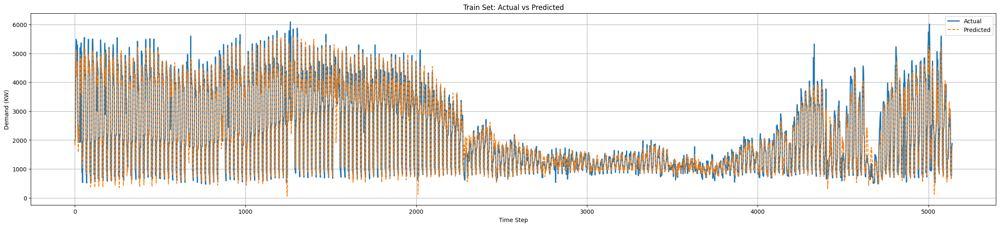

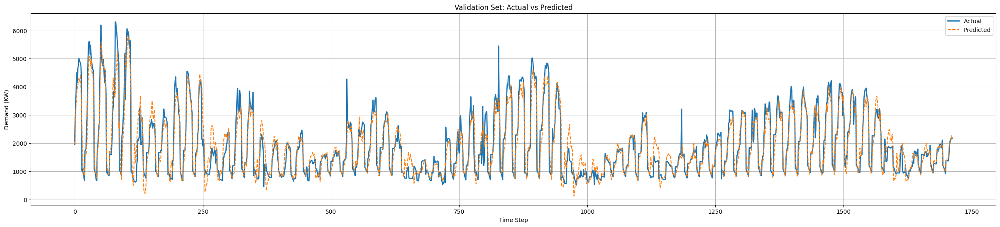

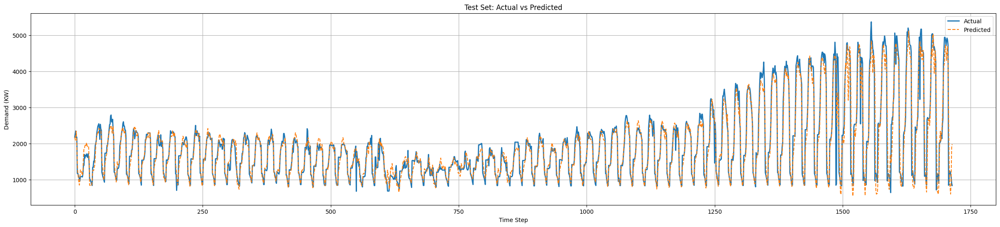

In [ ]:
# === Actual vs Predicted Plot Function ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 6))
    plt.plot(y_true, label='Actual', linewidth=2)
    plt.plot(y_pred, label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Unscale the true values
y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
y_val_true = scaler_y.inverse_transform(y_val_scaled.reshape(-1, 1)).ravel()
y_test_true = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

# === Plot Actual vs Predicted for all sets ===
plot_actual_vs_predicted(y_train_true, y_train_pred.ravel(), "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred.ravel(), "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred.ravel(), "Test Set: Actual vs Predicted")

# **Final**

Trial 10 Complete [00h 04m 01s]
val_loss: 0.01050061360001564

Best val_loss So Far: 0.007176515646278858
Total elapsed time: 00h 31m 24s

Best hyperparameters found:
units1 = 256
l2_reg = 0.001
dropout1 = 0.2
units2 = 64
dropout2 = 0.3
lr = 0.001
Epoch 1/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - loss: 0.7761 - val_loss: 0.1449
Epoch 2/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - loss: 0.2299 - val_loss: 0.1255
Epoch 3/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1631 - val_loss: 0.1179
Epoch 4/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.1420 - val_loss: 0.1139
Epoch 5/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1310 - val_loss: 0.1080
Epoch 6/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step - loss: 0.1213 - val_loss: 0.1026
Epoch 7/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - loss: 0.1129 - val_loss: 0.0980
Epoch 8/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1057 - val_loss: 0.0934
Epoch 9/50
81/81 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - loss: 0.0989 - val_

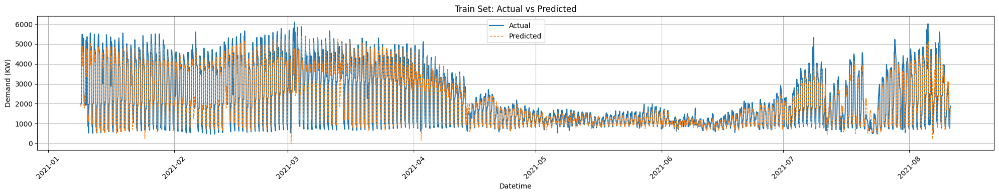

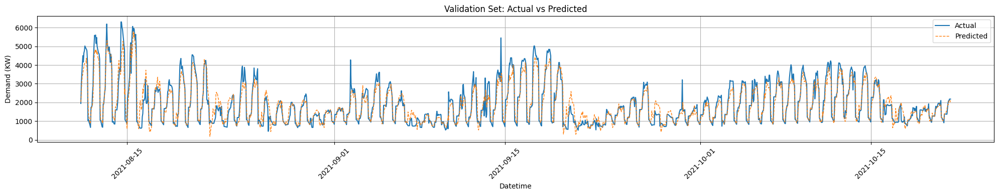

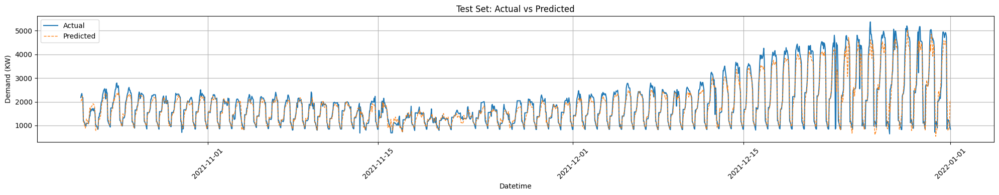


Forecast next 24 hours:
2022-01-01 01:00:00 -> 2062.78 KW
2022-01-01 02:00:00 -> 2122.70 KW
2022-01-01 03:00:00 -> 2068.26 KW
2022-01-01 04:00:00 -> 2075.85 KW
2022-01-01 05:00:00 -> 2352.76 KW
2022-01-01 06:00:00 -> 2987.97 KW
2022-01-01 07:00:00 -> 3367.35 KW
2022-01-01 08:00:00 -> 3896.52 KW
2022-01-01 09:00:00 -> 4033.19 KW
2022-01-01 10:00:00 -> 4266.71 KW
2022-01-01 11:00:00 -> 4362.67 KW
2022-01-01 12:00:00 -> 4576.04 KW
2022-01-01 13:00:00 -> 4524.12 KW
2022-01-01 14:00:00 -> 4269.81 KW
2022-01-01 15:00:00 -> 4590.38 KW
2022-01-01 16:00:00 -> 4429.12 KW
2022-01-01 17:00:00 -> 4029.10 KW
2022-01-01 18:00:00 -> 2391.03 KW
2022-01-01 19:00:00 -> 1725.51 KW
2022-01-01 20:00:00 -> 1418.33 KW
2022-01-01 21:00:00 -> 1118.97 KW
2022-01-01 22:00:00 -> 923.38 KW
2022-01-01 23:00:00 -> 845.73 KW
2022-01-02 00:00:00 -> 1075.49 KW


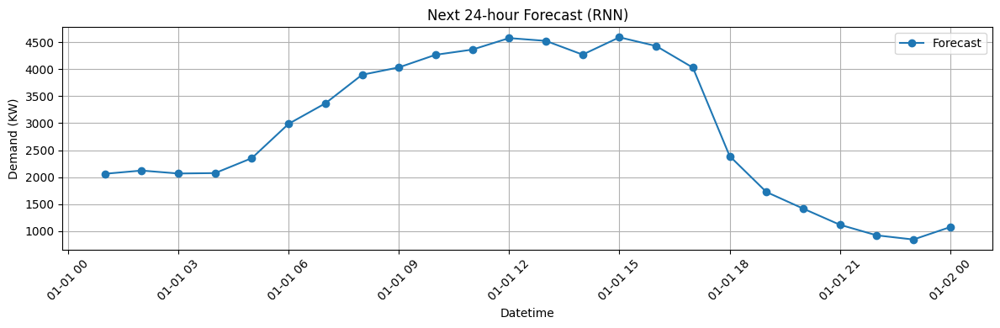


Model saved to 'rnn_demand_model.h5'


In [ ]:
# Full end-to-end script: datetime fix, preprocessing, RNN (Keras Tuner), evaluation, plots, and 24h forecast.
# Copy-paste and run (ensure required packages are installed: pandas, numpy, matplotlib, scikit-learn, tensorflow, keras-tuner).

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import timedelta

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

from kerastuner.tuners import RandomSearch

# ---------------------------
# 0. (ASSUMPTION) You have `df` already loaded in memory.
# If not, load it, for example:
# df = pd.read_csv('your_file.csv')
# ---------------------------

# ---------- 1) CLEAN & BUILD DATETIME INDEX (handles "24:00") ----------
# Ensure DATE is datetime (if it's not, convert)
if not np.issubdtype(df['DATE'].dtype, np.datetime64):
    df['DATE'] = pd.to_datetime(df['DATE'])

# Ensure TIME is string and normalize "HH-MM" -> "HH:MM"
df['TIME'] = df['TIME'].astype(str).str.replace('-', ':')

# Fix rows where TIME == "24:00" by shifting date to next day and using "00:00"
def fix_datetime_str(row):
    date = row['DATE']
    t = row['TIME']
    if t == "24:00":
        new_date = (date + pd.Timedelta(days=1)).strftime('%Y-%m-%d')
        return f"{new_date} 00:00"
    else:
        return f"{date.strftime('%Y-%m-%d')} {t}"

df['DATETIME_STR'] = df.apply(fix_datetime_str, axis=1)
df['Datetime'] = pd.to_datetime(df['DATETIME_STR'], format=None, errors='raise')
df = df.set_index('Datetime').sort_index()
df.drop(columns=['DATETIME_STR'], inplace=True)

# ---------- 2) FEATURE ENGINEERING ----------
# Create lags and rolling means (as in your original code)
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)

df['rolling_mean_24'] = df['Demand(KW)'].rolling(window=24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(window=168, min_periods=1).mean()

# Drop NaNs produced by shifts
df.dropna(inplace=True)

# Features and target
features = ['Demand(KW)', 'Temp (C)', 'Wind Gust', 'PF',
            'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']

X = df[features].values
y = df['Demand(KW)'].values

# ---------- 3) CREATE SEQUENCES ----------
def create_sequences(X, y, time_steps=24):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

time_steps = 24
X_seq, y_seq = create_sequences(X, y, time_steps=time_steps)

# ---------- 4) SPLIT: Train / Val / Test ----------
train_size = int(len(X_seq) * 0.6)
val_size = int(len(X_seq) * 0.2)

X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val = X_seq[train_size:train_size + val_size], y_seq[train_size:train_size + val_size]
X_test, y_test = X_seq[train_size + val_size:], y_seq[train_size + val_size:]

# ---------- 5) SCALE FEATURES & TARGET ----------
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

# Fit on train only (reshape to 2D then back)
n_features = X_train.shape[-1]
X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, n_features)).reshape(X_train.shape)
X_val_scaled = scaler_X.transform(X_val.reshape(-1, n_features)).reshape(X_val.shape)
X_test_scaled = scaler_X.transform(X_test.reshape(-1, n_features)).reshape(X_test.shape)

y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# ---------- 6) KERAS TUNER & MODEL ----------
def build_model(hp):
    model = Sequential()
    model.add(SimpleRNN(
        hp.Int('units1', 64, 256, step=64),
        return_sequences=True,
        input_shape=(X_train.shape[1], X_train.shape[2]),
        kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005]))
    ))
    model.add(Dropout(hp.Choice('dropout1', [0.2, 0.3, 0.4])))

    model.add(SimpleRNN(
        hp.Int('units2', 32, 128, step=32),
        kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005]))
    ))
    model.add(Dropout(hp.Choice('dropout2', [0.2, 0.3, 0.4])))

    model.add(Dense(1))
    model.compile(optimizer=Adam(hp.Choice('lr', [1e-3, 5e-4, 1e-4])), loss='mse')
    return model

# Note: Tuning can be slow. You can reduce max_trials for faster run.
tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='rnn_tuning_dir',
    project_name='electricity_rnn'
)

tuner.search(
    X_train_scaled, y_train_scaled,
    epochs=50,
    batch_size=64,
    validation_data=(X_val_scaled, y_val_scaled),
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
    verbose=1
)

best_hp = tuner.get_best_hyperparameters(1)[0]
print("\nBest hyperparameters found:")
for k in best_hp.values:
    print(k, "=", best_hp.get(k))

# Build & train best model (you could also use tuner.get_best_models())
model = tuner.hypermodel.build(best_hp)
history = model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_val_scaled, y_val_scaled),
    epochs=50,
    batch_size=64,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
    verbose=1
)

# ---------- 7) EVALUATION (Train / Val / Test) ----------
def evaluate_model(model, X_scaled, y_scaled, scaler_y, set_name):
    y_pred_scaled = model.predict(X_scaled, verbose=0)           # shape (n,1)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)           # shape (n,1)
    y_true = scaler_y.inverse_transform(y_scaled.reshape(-1,1))  # shape (n,1)

    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{set_name} Set Metrics:")
    print(f"  MSE: {mse:.4f}")
    print(f"  MAE: {mae:.4f}")
    print(f"  R²:  {r2:.4f}")

    return y_pred.ravel()

y_train_pred = evaluate_model(model, X_train_scaled, y_train_scaled, scaler_y, "Train")
y_val_pred = evaluate_model(model, X_val_scaled, y_val_scaled, scaler_y, "Validation")
y_test_pred = evaluate_model(model, X_test_scaled, y_test_scaled, scaler_y, "Test")

# ---------- 8) PREPARE DATE INDEX FOR PLOTTING ----------
# The sequences start at index `time_steps`, so align dates accordingly
dates = df.index[time_steps:]   # length = len(X_seq)
train_dates = dates[:train_size]
val_dates = dates[train_size:train_size + val_size]
test_dates = dates[train_size + val_size:]

# True (unscaled) values for plotting
y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1,1)).ravel()
y_val_true = scaler_y.inverse_transform(y_val_scaled.reshape(-1,1)).ravel()
y_test_true = scaler_y.inverse_transform(y_test_scaled.reshape(-1,1)).ravel()

# ---------- 9) PLOTTING FUNCTION (uses datetime on x-axis) ----------
def plot_actual_vs_predicted(dates, actual, predicted, title, figsize=(16,4)):
    plt.figure(figsize=figsize)
    plt.plot(dates, actual, label='Actual', linewidth=1.5)
    plt.plot(dates, predicted, label='Predicted', linestyle='--', linewidth=1)
    plt.title(title)
    plt.xlabel('Datetime')
    plt.ylabel('Demand (KW)')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_actual_vs_predicted(train_dates, y_train_true, y_train_pred, "Train Set: Actual vs Predicted", figsize=(20,4))
plot_actual_vs_predicted(val_dates, y_val_true, y_val_pred, "Validation Set: Actual vs Predicted", figsize=(20,4))
plot_actual_vs_predicted(test_dates, y_test_true, y_test_pred, "Test Set: Actual vs Predicted", figsize=(20,4))

# ---------- 10) FORECAST NEXT 24 HOURS (using iterative feeding) ----------
# Use the very last sequence from X_seq (unscaled), scale it, then iteratively predict
last_sequence = X_seq[-1]  # shape (time_steps, n_features)
last_sequence_scaled = scaler_X.transform(last_sequence.reshape(-1, n_features)).reshape(1, time_steps, n_features)

forecast_scaled = []
forecast_unscaled = []
current_seq = last_sequence_scaled.copy()

for i in range(24):
    pred_scaled = model.predict(current_seq, verbose=0)    # shape (1,1) in target-scale
    forecast_scaled.append(pred_scaled[0,0])
    # unscale
    pred_unscaled = scaler_y.inverse_transform(pred_scaled.reshape(-1,1))[0,0]
    forecast_unscaled.append(pred_unscaled)

    # prepare next input sequence: shift left and append new features
    next_features = current_seq[0, -1, :].copy()   # last timestep features (scaled)
    # update the Demand(KW) feature (index 0) with predicted scaled demand
    next_features[0] = pred_scaled[0,0]
    # roll and set last
    current_seq = np.roll(current_seq, -1, axis=1)
    current_seq[0, -1, :] = next_features

# Print forecast with datetimes
start_dt = df.index[-1] + pd.Timedelta(hours=1)   # forecast begins next hour after last row
print("\nForecast next 24 hours:")
for i, val in enumerate(forecast_unscaled):
    ts = start_dt + pd.Timedelta(hours=i)
    print(f"{ts} -> {val:.2f} KW")

# Plot forecast
forecast_dates = [start_dt + pd.Timedelta(hours=i) for i in range(len(forecast_unscaled))]
plt.figure(figsize=(12,4))
plt.plot(forecast_dates, forecast_unscaled, marker='o', label='Forecast')
plt.title('Next 24-hour Forecast (RNN)')
plt.xlabel('Datetime')
plt.ylabel('Demand (KW)')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# ---------- 11) SAVE MODEL ----------
model.save('rnn_demand_model.h5')
print("\nModel saved to 'rnn_demand_model.h5'")


# Bidirectional LSTM.

In [ ]:
pip install keras-tuner --upgrade


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.6 MB/s eta 0:00:00


Reloading Tuner from bilstm_tuning_dir/electricity_bilstm/tuner0.json

Best Hyperparameters:
units1: 128
l2_reg: 0.001
dropout1: 0.2
units2: 32
dropout2: 0.2
lr: 0.001
Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.3304 - val_loss: 0.1268
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.1064 - val_loss: 0.0585
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0548 - val_loss: 0.0375
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0376 - val_loss: 0.0273
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - loss: 0.0286 - val_loss: 0.0235
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step - loss: 0.0245 - val_loss: 0.0172
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.0187 - val_loss: 0.0152
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.0175 - val_loss: 0.0124
Epoch 9/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.0142 - val_loss: 0.0109
Epoch 10/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step -

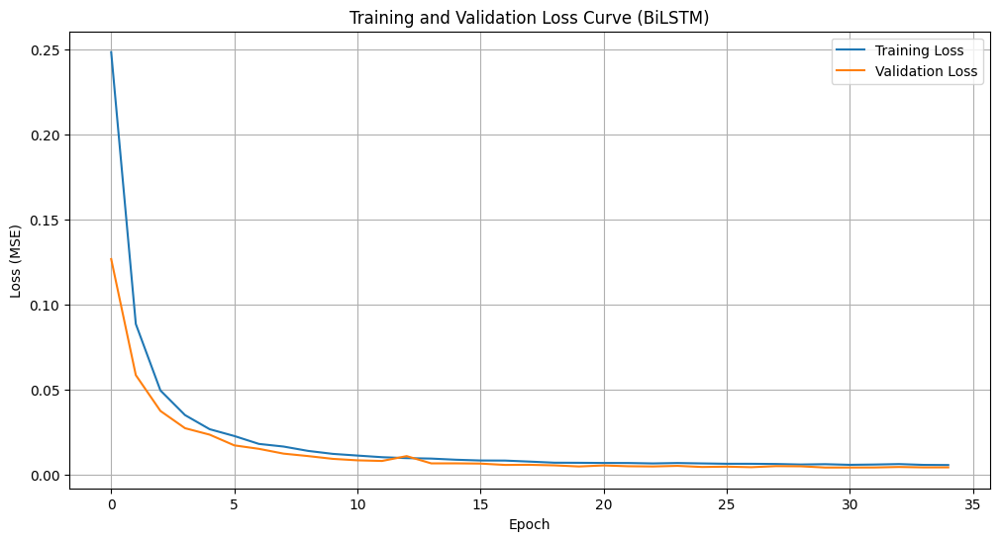


=== BiLSTM Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 1574.3326
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 1784.0657
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 2131.5576
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 2705.9548
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 3571.8232
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 4700.6611
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 5883.9053
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 6991.9546
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 7761.4204
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 8207.9590
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 8432.1162
Date: 2021-12-31 12:00:00, Predicted Demand(KW): 8481.2324
Date: 2021-12-31 13:00:00, Predicted Demand(KW): 8417.9990
Date: 2021-12-31 14:00:00, Predicted Demand(KW): 8283.0986
Date: 2021-12-31 15:00:00, Predicted Demand(KW): 8197.1846
Date: 2021-12-31 16:00:00, Predicted Demand(KW): 7970.4990
Date: 202

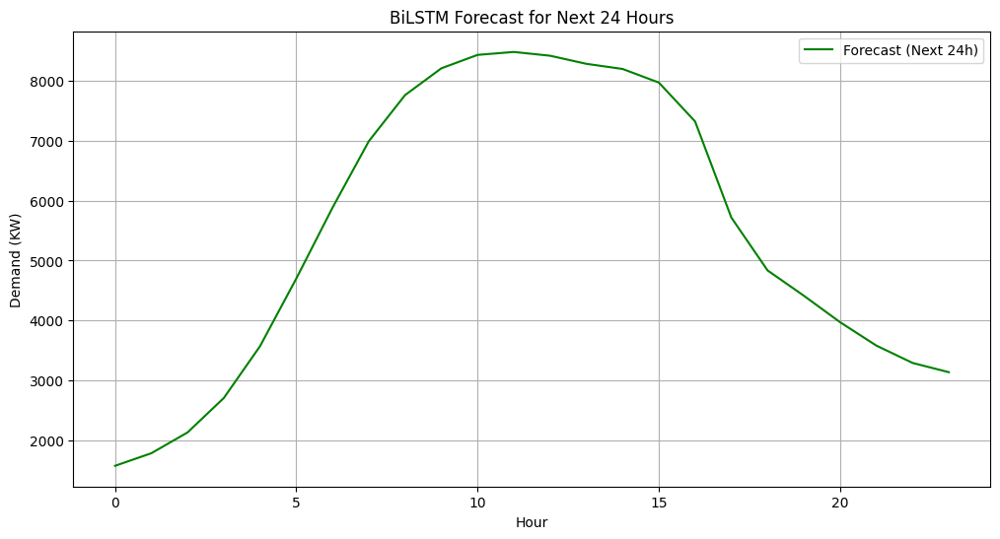

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
# === Data Preparation (unchanged) ===
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)
df['rolling_mean_24'] = df['Demand(KW)'].rolling(window=24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(window=168, min_periods=1).mean()
df.dropna(inplace=True)

features = ['Demand(KW)','Temp (C)', 'Wind Gust','PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
X = df[features].values
y = df['Demand(KW)'].values

def create_sequences(X, y, time_steps=24):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

X_seq, y_seq = create_sequences(X, y, time_steps=24)
train_size = int(len(X_seq) * 0.6)
val_size = int(len(X_seq) * 0.2)
X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val = X_seq[train_size:train_size + val_size], y_seq[train_size:train_size + val_size]
X_test, y_test = X_seq[train_size + val_size:], y_seq[train_size + val_size:]

scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val_scaled = scaler_X.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
X_test_scaled = scaler_X.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# === Keras Tuner for Bidirectional LSTM ===
def build_model(hp):
    model = Sequential()
    model.add(Bidirectional(LSTM(hp.Int('units1', 64, 256, step=64), return_sequences=True,
                                 kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005]))),
                            input_shape=(X_train.shape[1], X_train.shape[2]))) # Closing parenthesis added here
    model.add(Dropout(hp.Choice('dropout1', [0.2, 0.3, 0.4])))
    model.add(Bidirectional(LSTM(hp.Int('units2', 32, 128, step=32),
                                 kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005])))))
    model.add(Dropout(hp.Choice('dropout2', [0.2, 0.3, 0.4])))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('lr', [1e-3, 5e-4, 1e-4])), loss='mse')
    return model

tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='bilstm_tuning_dir',
    project_name='electricity_bilstm'
)

tuner.search(X_train_scaled, y_train_scaled,
             epochs=50,
             batch_size=64,
             validation_data=(X_val_scaled, y_val_scaled),
             callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
             verbose=1)

best_hp = tuner.get_best_hyperparameters(1)[0]
print("\nBest Hyperparameters:")
for param in best_hp.values:
    print(f"{param}: {best_hp.get(param)}")

# Retrain best model
model = tuner.hypermodel.build(best_hp)
history = model.fit(X_train_scaled, y_train_scaled,
                    validation_data=(X_val_scaled, y_val_scaled),
                    epochs=50,
                    batch_size=64,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
                    verbose=1)

# === Evaluation ===
def evaluate_model(model, X, y, scaler_y, set_name):
    y_pred_scaled = model.predict(X, verbose=0)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y.reshape(-1, 1))
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"\n{set_name} Set Metrics:")
    print(f"MSE: {mse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R²: {r2:.4f}")
    return y_pred

y_train_pred = evaluate_model(model, X_train_scaled, y_train_scaled, scaler_y, "Train")
y_val_pred = evaluate_model(model, X_val_scaled, y_val_scaled, scaler_y, "Validation")
y_test_pred = evaluate_model(model, X_test_scaled, y_test_scaled, scaler_y, "Test")

# === Loss Plot ===
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Curve (BiLSTM)')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.show()

# === Forecast next 24 hours ===
last_sequence = X_seq[-1]
last_sequence_scaled = scaler_X.transform(last_sequence.reshape(-1, len(features))).reshape(1, 24, len(features))
forecast = []
current_sequence = last_sequence_scaled

for _ in range(24):
    pred_scaled = model.predict(current_sequence, verbose=0)
    pred = scaler_y.inverse_transform(pred_scaled)[0, 0]
    forecast.append(pred)
    next_features = current_sequence[0, -1, :].copy()
    next_features[0] = pred_scaled[0, 0]
    current_sequence = np.roll(current_sequence, -1, axis=1)
    current_sequence[0, -1, :] = next_features

print("\n=== BiLSTM Forecast for the Next 24 Hours ===")
start_date = datetime(2021, 12, 31, 1)
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")

# Plot forecast
plt.figure(figsize=(12, 6))
plt.plot(forecast, label='Forecast (Next 24h)', color='green')
plt.title('BiLSTM Forecast for Next 24 Hours')
plt.xlabel('Hour')
plt.ylabel('Demand (KW)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Save the best trained model
model.save("best_bidirectional_lstm_model.h5")
print("✅ Model saved successfully as best_bidirectional_lstm_model.h5")

✅ Model saved successfully as best_bidirectional_lstm_model.h5


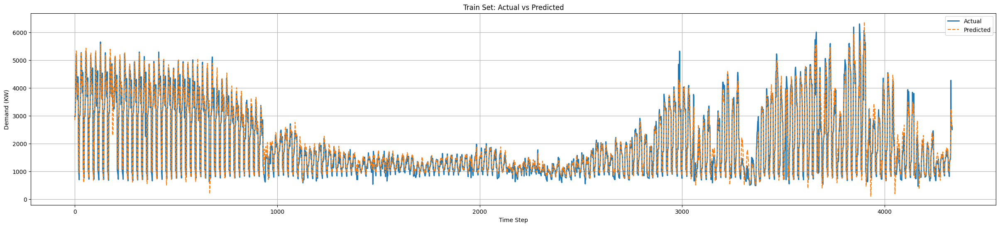

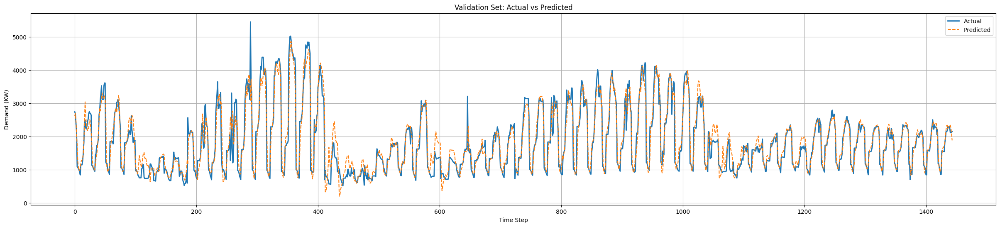

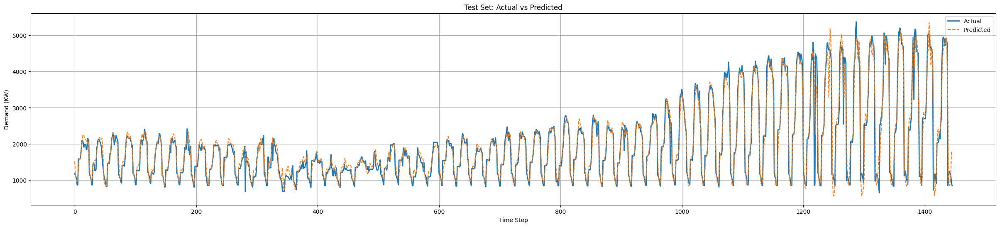

In [ ]:
# === Actual vs Predicted Plot ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 6))
    plt.plot(y_true, label='Actual', linewidth=2)
    plt.plot(y_pred, label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Unscaled predictions
y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
y_val_true = scaler_y.inverse_transform(y_val_scaled.reshape(-1, 1)).ravel()
y_test_true = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

plot_actual_vs_predicted(y_train_true, y_train_pred.ravel(), "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred.ravel(), "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred.ravel(), "Test Set: Actual vs Predicted")


# **final**

Trial 10 Complete [00h 15m 49s]
val_loss: 0.00623633386567235

Best val_loss So Far: 0.005484522320330143
Total elapsed time: 02h 15m 39s
Epoch 1/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 173ms/step - loss: 0.4957 - val_loss: 0.2537
Epoch 2/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.2122 - val_loss: 0.1213
Epoch 3/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.1058 - val_loss: 0.0700
Epoch 4/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 21s 169ms/step - loss: 0.0640 - val_loss: 0.0487
Epoch 5/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 170ms/step - loss: 0.0442 - val_loss: 0.0367
Epoch 6/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0342 - val_loss: 0.0297
Epoch 7/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 169ms/step - loss: 0.0275 - val_loss: 0.0254
Epoch 8/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 165ms/step - loss: 0.0233 - val_loss: 0.0210
Epoch 9/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0201 - val_loss: 0.0180
Epoch 10/50
79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0177 - val_loss

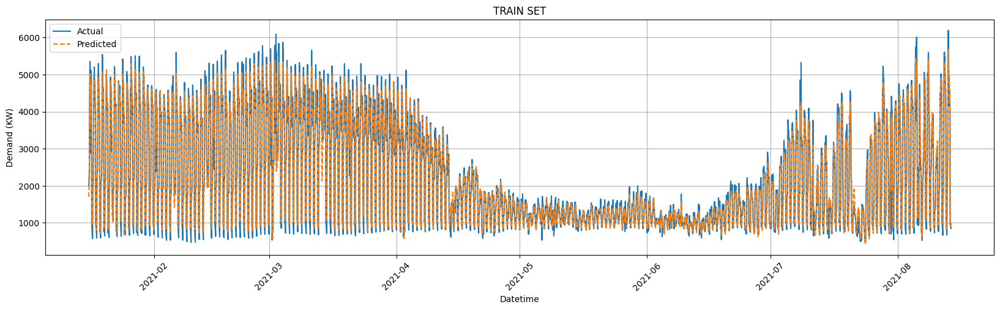

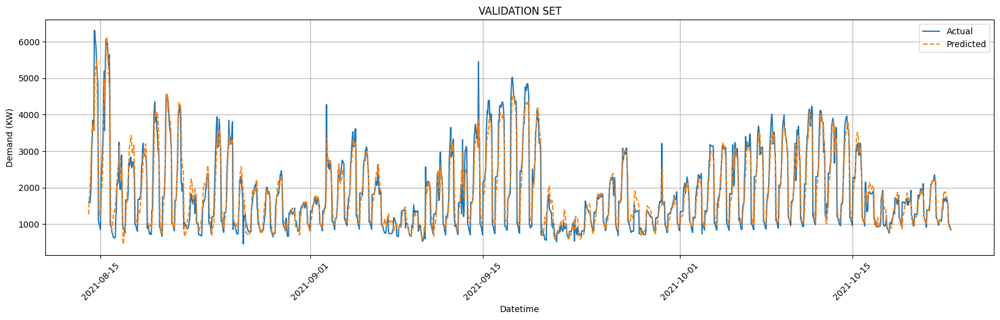

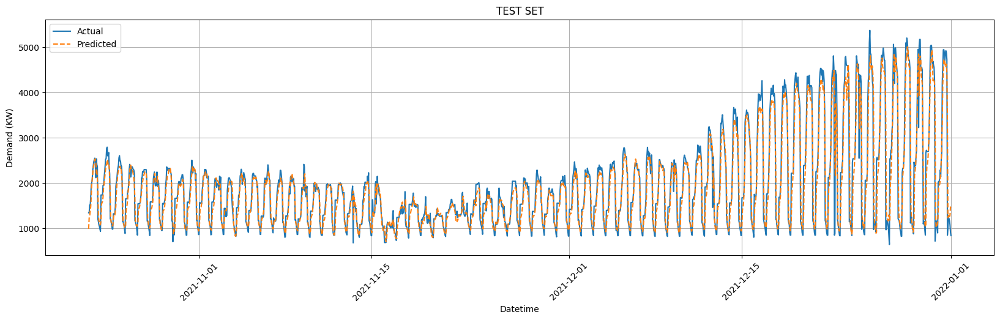

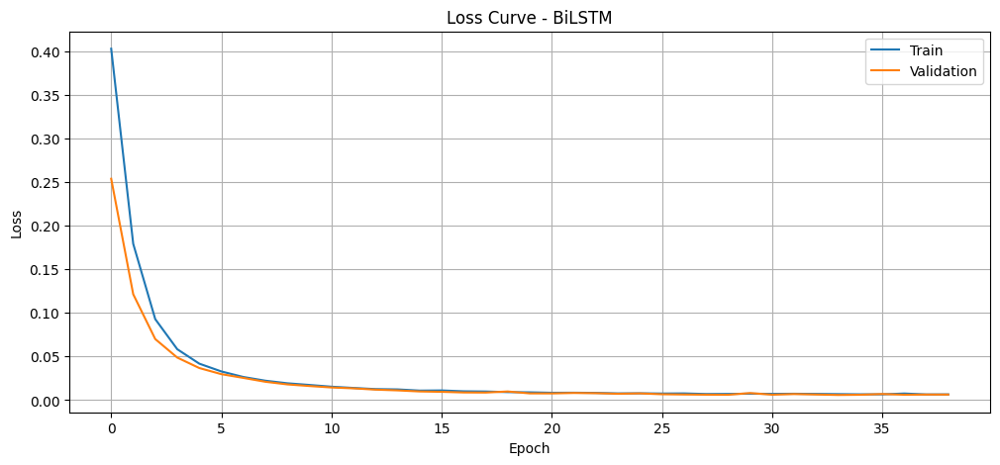

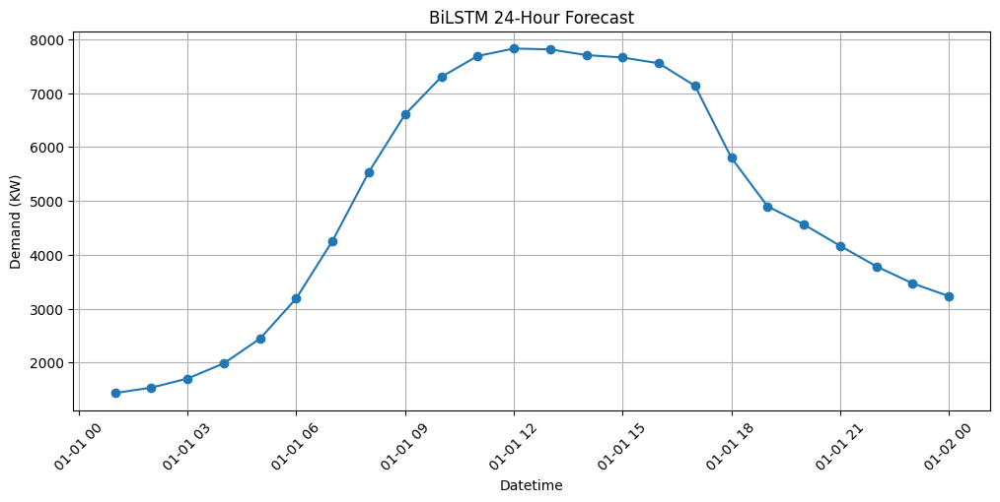

In [ ]:
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from kerastuner.tuners import RandomSearch
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from datetime import timedelta

# ---------- FEATURE ENGINEERING ----------
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)
df['rolling_mean_24'] = df['Demand(KW)'].rolling(24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(168, min_periods=1).mean()
df.dropna(inplace=True)

features = ['Demand(KW)','Temp (C)', 'Wind Gust','PF',
            'lag_1', 'lag_24', 'lag_168',
            'rolling_mean_24', 'rolling_mean_168']

X = df[features].values
y = df['Demand(KW)'].values

# ---------- SEQUENCE CREATION ----------
def create_sequences(X, y, time_steps=24):
    xs, ys = [], []
    for i in range(len(X) - time_steps):
        xs.append(X[i:i+time_steps])
        ys.append(y[i+time_steps])
    return np.array(xs), np.array(ys)

X_seq, y_seq = create_sequences(X, y, time_steps=24)

train_size = int(len(X_seq) * 0.6)
val_size   = int(len(X_seq) * 0.2)

X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val     = X_seq[train_size:train_size + val_size], y_seq[train_size:train_size + val_size]
X_test, y_test   = X_seq[train_size + val_size:], y_seq[train_size + val_size:]

# ---------- SCALING ----------
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val_scaled   = scaler_X.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
X_test_scaled  = scaler_X.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1,1)).ravel()
y_val_scaled   = scaler_y.transform(y_val.reshape(-1,1)).ravel()
y_test_scaled  = scaler_y.transform(y_test.reshape(-1,1)).ravel()

# ---------- BiLSTM MODEL WITH KERAS TUNER ----------
def build_model(hp):
    model = Sequential()
    model.add(Bidirectional(LSTM(
        hp.Int("units1", 64, 256, step=64),
        return_sequences=True,
        kernel_regularizer=l2(hp.Choice("l2_reg", [0.001, 0.005]))
    ), input_shape=(X_train.shape[1], X_train.shape[2])))

    model.add(Dropout(hp.Choice("dropout1", [0.2, 0.3, 0.4])))

    model.add(Bidirectional(LSTM(
        hp.Int("units2", 32, 128, step=32),
        kernel_regularizer=l2(hp.Choice("l2_reg", [0.001, 0.005]))
    )))

    model.add(Dropout(hp.Choice("dropout2", [0.2, 0.3, 0.4])))

    model.add(Dense(1))

    model.compile(
        optimizer=Adam(hp.Choice("lr", [1e-3, 5e-4, 1e-4])),
        loss="mse"
    )
    return model

tuner = RandomSearch(
    build_model,
    objective="val_loss",
    max_trials=10,
    directory="bilstm_tuning",
    project_name="electricity"
)

tuner.search(
    X_train_scaled, y_train_scaled,
    validation_data=(X_val_scaled, y_val_scaled),
    epochs=50,
    batch_size=64,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

best_hp = tuner.get_best_hyperparameters(1)[0]
model = tuner.hypermodel.build(best_hp)

history = model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_val_scaled, y_val_scaled),
    epochs=50,
    batch_size=64,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

# ---------- EVALUATION ----------
def evaluate(model, X, y, scaler_y, name):
    y_pred_scaled = model.predict(X, verbose=0)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y.reshape(-1,1))
    print(f"\n{name} MSE = {mean_squared_error(y_true, y_pred):.4f}")
    print(f"{name} MAE = {mean_absolute_error(y_true, y_pred):.4f}")
    print(f"{name} R²  = {r2_score(y_true, y_pred):.4f}")
    return y_pred.ravel()

y_train_pred = evaluate(model, X_train_scaled, y_train_scaled, scaler_y, "TRAIN")
y_val_pred   = evaluate(model, X_val_scaled, y_val_scaled, scaler_y, "VAL")
y_test_pred  = evaluate(model, X_test_scaled, y_test_scaled, scaler_y, "TEST")

# ---------- DATE INDEX FOR PLOTS ----------
dates = df.index[24:]
train_dates = dates[:train_size]
val_dates   = dates[train_size:train_size+val_size]
test_dates  = dates[train_size+val_size:]

y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1,1)).ravel()
y_val_true   = scaler_y.inverse_transform(y_val_scaled.reshape(-1,1)).ravel()
y_test_true  = scaler_y.inverse_transform(y_test_scaled.reshape(-1,1)).ravel()

# ---------- PLOTTING ----------
def plot_actual_vs_predicted(dates, actual, pred, title):
    plt.figure(figsize=(20,5))
    plt.plot(dates, actual, label="Actual")
    plt.plot(dates, pred, label="Predicted", linestyle="--")
    plt.title(title)
    plt.xlabel("Datetime")
    plt.ylabel("Demand (KW)")
    plt.xticks(rotation=45)
    plt.grid()
    plt.legend()
    plt.show()

plot_actual_vs_predicted(train_dates, y_train_true, y_train_pred, "TRAIN SET")
plot_actual_vs_predicted(val_dates, y_val_true, y_val_pred, "VALIDATION SET")
plot_actual_vs_predicted(test_dates, y_test_true, y_test_pred, "TEST SET")

# ---------- LOSS CURVE ----------
plt.figure(figsize=(12,5))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("Loss Curve - BiLSTM")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(["Train", "Validation"])
plt.grid()
plt.show()

# ---------- FORECAST NEXT 24 HOURS ----------
last_seq = X_seq[-1]
last_seq_scaled = scaler_X.transform(last_seq.reshape(-1, len(features))).reshape(1, 24, len(features))

forecast = []
forecast_dates = []

start_dt = df.index[-1] + timedelta(hours=1)

current = last_seq_scaled.copy()

for i in range(24):
    pred_scaled = model.predict(current, verbose=0)
    pred = scaler_y.inverse_transform(pred_scaled)[0,0]
    forecast.append(pred)

    forecast_dates.append(start_dt + timedelta(hours=i))

    next_features = current[0, -1, :].copy()
    next_features[0] = pred_scaled[0,0]

    current = np.roll(current, -1, axis=1)
    current[0, -1, :] = next_features

# ---------- FORECAST PLOT ----------
plt.figure(figsize=(12,5))
plt.plot(forecast_dates, forecast, marker='o')
plt.title("BiLSTM 24-Hour Forecast")
plt.xlabel("Datetime")
plt.ylabel("Demand (KW)")
plt.xticks(rotation=45)
plt.grid()
plt.show()


Correlation of features with Demand(KW):
Demand(KW)          1.000000
CURRENT             0.992009
lag_1               0.914240
lag_24              0.894110
lag_168             0.764125
rolling_mean_24     0.623552
rolling_mean_168    0.553331
Temp (C)            0.198459
Wind Gust           0.158572
PF                  0.081988
Weakend             0.018496
SEASON             -0.024097
Month              -0.155569
Humidity (%)       -0.374398
Name: Demand(KW), dtype: float64


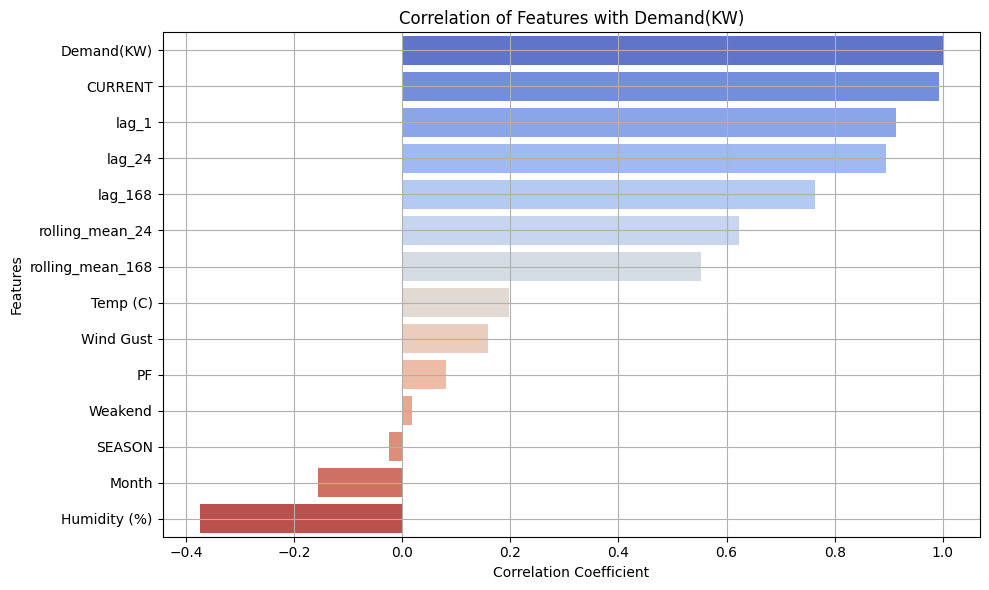

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the columns to use
columns = ['Demand(KW)', 'Weakend', 'SEASON', 'Temp (C)', 'Month', 'Humidity (%)', 'Wind Gust',
           'CURRENT', 'PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']

# Compute correlation matrix
correlation_matrix = df[columns].corr()

# Extract correlations with Demand(KW)
demand_corr = correlation_matrix['Demand(KW)'].sort_values(ascending=False)

# Print correlation values
print("Correlation of features with Demand(KW):")
print(demand_corr)

# Plot correlation as bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=demand_corr.values, y=demand_corr.index, palette='coolwarm')
plt.title('Correlation of Features with Demand(KW)')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.grid(True)
plt.tight_layout()
plt.show()

# Bidirectional GRU

Reloading Tuner from bigru_tuning_dir/electricity_bigru/tuner0.json

Best Hyperparameters:
units1: 64
l2_reg: 0.001
dropout1: 0.3
units2: 64
dropout2: 0.3
lr: 0.0005
Epoch 1/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 18s 126ms/step - loss: 0.3593 - val_loss: 0.2200
Epoch 2/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2032 - val_loss: 0.1426
Epoch 3/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1346 - val_loss: 0.1005
Epoch 4/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - loss: 0.0969 - val_loss: 0.0761
Epoch 5/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - loss: 0.0752 - val_loss: 0.0613
Epoch 6/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.0607 - val_loss: 0.0510
Epoch 7/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.0509 - val_loss: 0.0438
Epoch 8/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.0444 - val_loss: 0.0380
Epoch 9/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.0385 - val_loss: 0.0332
Epoch 10/50
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - loss: 0.0341 

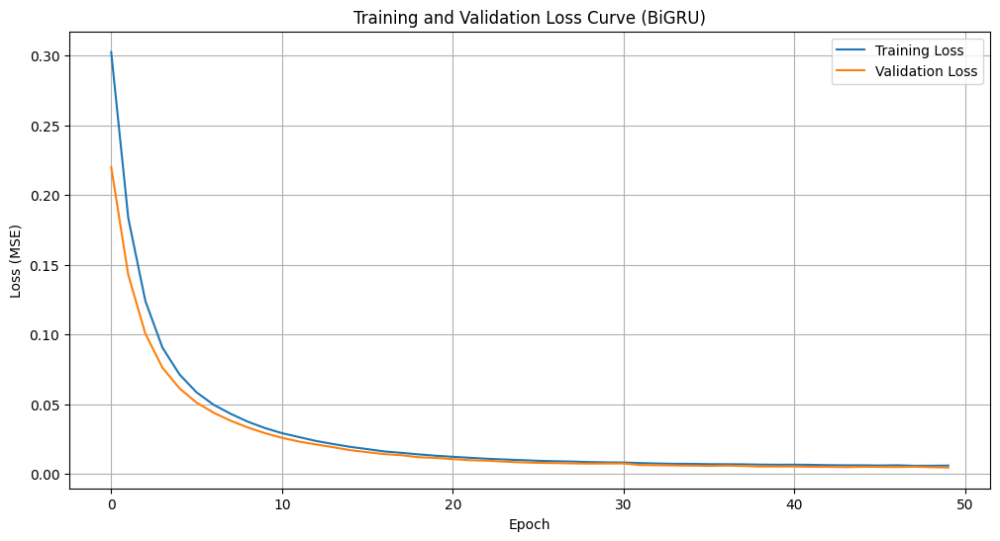


=== BiGRU Forecast for the Next 24 Hours ===
Date: 2021-12-31 01:00:00, Predicted Demand(KW): 1812.2349
Date: 2021-12-31 02:00:00, Predicted Demand(KW): 2059.9863
Date: 2021-12-31 03:00:00, Predicted Demand(KW): 2323.1147
Date: 2021-12-31 04:00:00, Predicted Demand(KW): 2602.5635
Date: 2021-12-31 05:00:00, Predicted Demand(KW): 2922.3877
Date: 2021-12-31 06:00:00, Predicted Demand(KW): 3474.3179
Date: 2021-12-31 07:00:00, Predicted Demand(KW): 4341.0449
Date: 2021-12-31 08:00:00, Predicted Demand(KW): 5603.7222
Date: 2021-12-31 09:00:00, Predicted Demand(KW): 6779.6362
Date: 2021-12-31 10:00:00, Predicted Demand(KW): 7810.0977
Date: 2021-12-31 11:00:00, Predicted Demand(KW): 8638.4756
Date: 2021-12-31 12:00:00, Predicted Demand(KW): 9229.1074
Date: 2021-12-31 13:00:00, Predicted Demand(KW): 9664.5938
Date: 2021-12-31 14:00:00, Predicted Demand(KW): 10060.2617
Date: 2021-12-31 15:00:00, Predicted Demand(KW): 10521.1963
Date: 2021-12-31 16:00:00, Predicted Demand(KW): 10450.9678
Date: 2

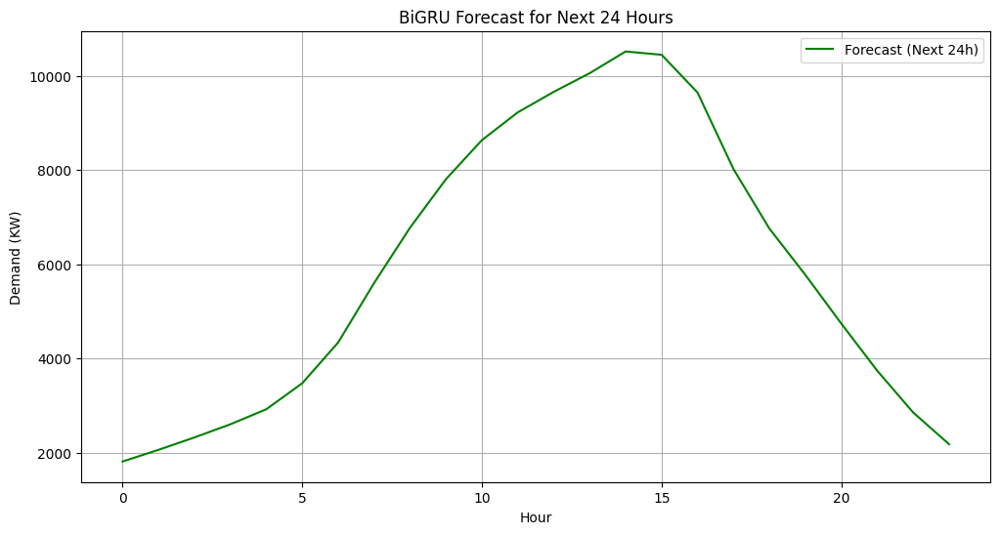

In [ ]:
from tensorflow.keras.layers import Bidirectional, GRU, Dense, Dropout

# === Data Preparation (unchanged) ===
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)
df['rolling_mean_24'] = df['Demand(KW)'].rolling(window=24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(window=168, min_periods=1).mean()
df.dropna(inplace=True)

features = ['Demand(KW)', 'Temp (C)', 'Wind Gust','PF', 'lag_1', 'lag_24', 'lag_168', 'rolling_mean_24', 'rolling_mean_168']
X = df[features].values
y = df['Demand(KW)'].values

def create_sequences(X, y, time_steps=24):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:(i + time_steps)])
        ys.append(y[i + time_steps])
    return np.array(Xs), np.array(ys)

X_seq, y_seq = create_sequences(X, y, time_steps=24)
train_size = int(len(X_seq) * 0.6)
val_size = int(len(X_seq) * 0.2)
X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val = X_seq[train_size:train_size + val_size], y_seq[train_size:train_size + val_size]
X_test, y_test = X_seq[train_size + val_size:], y_seq[train_size + val_size:]

scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val_scaled = scaler_X.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
X_test_scaled = scaler_X.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).ravel()

# === Keras Tuner for Bidirectional GRU ===
def build_model(hp):
    model = Sequential()
    model.add(Bidirectional(GRU(hp.Int('units1', 64, 256, step=64), return_sequences=True,
                                 kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005]))),
                            input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(hp.Choice('dropout1', [0.2, 0.3, 0.4])))
    model.add(Bidirectional(GRU(hp.Int('units2', 32, 128, step=32),
                                 kernel_regularizer=l2(hp.Choice('l2_reg', [0.001, 0.005])))))
    model.add(Dropout(hp.Choice('dropout2', [0.2, 0.3, 0.4])))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=hp.Choice('lr', [1e-3, 5e-4, 1e-4])), loss='mse')
    return model

tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='bigru_tuning_dir',
    project_name='electricity_bigru'
)

tuner.search(X_train_scaled, y_train_scaled,
             epochs=50,
             batch_size=64,
             validation_data=(X_val_scaled, y_val_scaled),
             callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
             verbose=1)

best_hp = tuner.get_best_hyperparameters(1)[0]
print("\nBest Hyperparameters:")
for param in best_hp.values:
    print(f"{param}: {best_hp.get(param)}")

# Retrain best model
model = tuner.hypermodel.build(best_hp)
history = model.fit(X_train_scaled, y_train_scaled,
                    validation_data=(X_val_scaled, y_val_scaled),
                    epochs=50,
                    batch_size=64,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
                    verbose=1)

# === Evaluation ===
def evaluate_model(model, X, y, scaler_y, set_name):
    y_pred_scaled = model.predict(X, verbose=0)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y.reshape(-1, 1))
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"\n{set_name} Set Metrics:")
    print(f"MSE: {mse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R²: {r2:.4f}")
    return y_pred

y_train_pred = evaluate_model(model, X_train_scaled, y_train_scaled, scaler_y, "Train")
y_val_pred = evaluate_model(model, X_val_scaled, y_val_scaled, scaler_y, "Validation")
y_test_pred = evaluate_model(model, X_test_scaled, y_test_scaled, scaler_y, "Test")

# === Loss Plot ===
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Curve (BiGRU)')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.show()

# === Forecast next 24 hours ===
last_sequence = X_seq[-1]
last_sequence_scaled = scaler_X.transform(last_sequence.reshape(-1, len(features))).reshape(1, 24, len(features))
forecast = []
current_sequence = last_sequence_scaled

for _ in range(24):
    pred_scaled = model.predict(current_sequence, verbose=0)
    pred = scaler_y.inverse_transform(pred_scaled)[0, 0]
    forecast.append(pred)
    next_features = current_sequence[0, -1, :].copy()
    next_features[0] = pred_scaled[0, 0]
    current_sequence = np.roll(current_sequence, -1, axis=1)
    current_sequence[0, -1, :] = next_features

print("\n=== BiGRU Forecast for the Next 24 Hours ===")
start_date = datetime(2021, 12, 31, 1)
for i, pred in enumerate(forecast):
    forecast_time = start_date + timedelta(hours=i)
    print(f"Date: {forecast_time}, Predicted Demand(KW): {pred:.4f}")

# Plot forecast
plt.figure(figsize=(12, 6))
plt.plot(forecast, label='Forecast (Next 24h)', color='green')
plt.title('BiGRU Forecast for Next 24 Hours')
plt.xlabel('Hour')
plt.ylabel('Demand (KW)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# === Save the trained BiGRU model ===
model.save('bigru_demand_model.h5')
print("\n✅ Model saved as 'bigru_demand_model.h5'")



✅ Model saved as 'bigru_demand_model.h5'


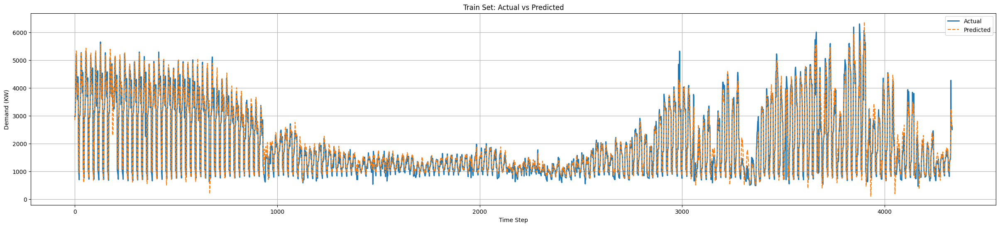

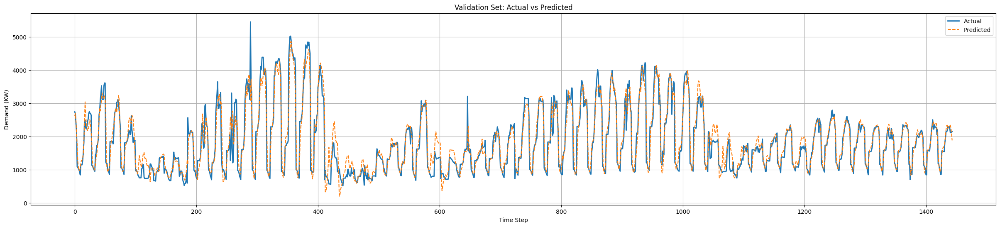

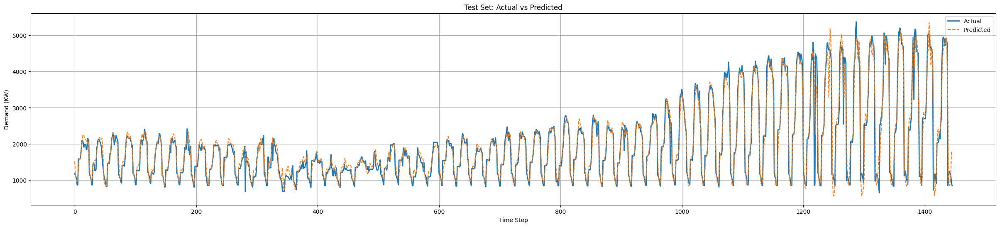

In [ ]:
# === Actual vs Predicted Plot Function ===
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(30, 6))
    plt.plot(y_true, label='Actual', linewidth=2)
    plt.plot(y_pred, label='Predicted', linestyle='--')
    plt.title(title)
    plt.xlabel('Time Step')
    plt.ylabel('Demand (KW)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Unscale y_true
y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1, 1)).ravel()
y_val_true = scaler_y.inverse_transform(y_val_scaled.reshape(-1, 1)).ravel()
y_test_true = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1)).ravel()

# === Plots ===
plot_actual_vs_predicted(y_train_true, y_train_pred.ravel(), "Train Set: Actual vs Predicted")
plot_actual_vs_predicted(y_val_true, y_val_pred.ravel(), "Validation Set: Actual vs Predicted")
plot_actual_vs_predicted(y_test_true, y_test_pred.ravel(), "Test Set: Actual vs Predicted")


# **Final**

Trial 10 Complete [00h 26m 36s]
val_loss: 0.008598115295171738

Best val_loss So Far: 0.005048766266554594
Total elapsed time: 02h 45m 46s
Epoch 1/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 34s 337ms/step - loss: 0.4689 - val_loss: 0.1536
Epoch 2/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 25s 323ms/step - loss: 0.1328 - val_loss: 0.0873
Epoch 3/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 25s 315ms/step - loss: 0.0797 - val_loss: 0.0584
Epoch 4/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 25s 326ms/step - loss: 0.0549 - val_loss: 0.0410
Epoch 5/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 24s 314ms/step - loss: 0.0382 - val_loss: 0.0302
Epoch 6/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 24s 312ms/step - loss: 0.0289 - val_loss: 0.0230
Epoch 7/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 41s 313ms/step - loss: 0.0218 - val_loss: 0.0185
Epoch 8/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 25s 320ms/step - loss: 0.0184 - val_loss: 0.0154
Epoch 9/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 24s 312ms/step - loss: 0.0153 - val_loss: 0.0129
Epoch 10/50
78/78 ━━━━━━━━━━━━━━━━━━━━ 24s 308ms/step - loss: 0.0128 - val_los

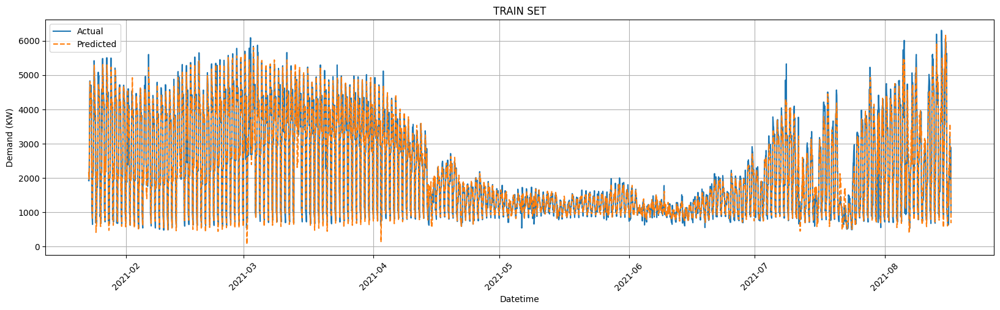

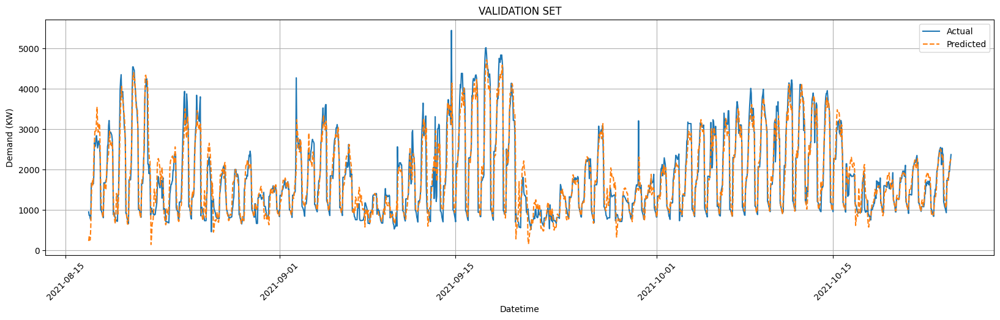

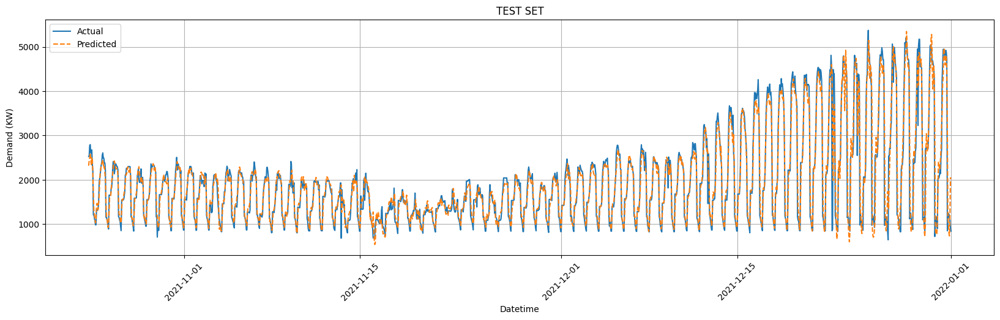

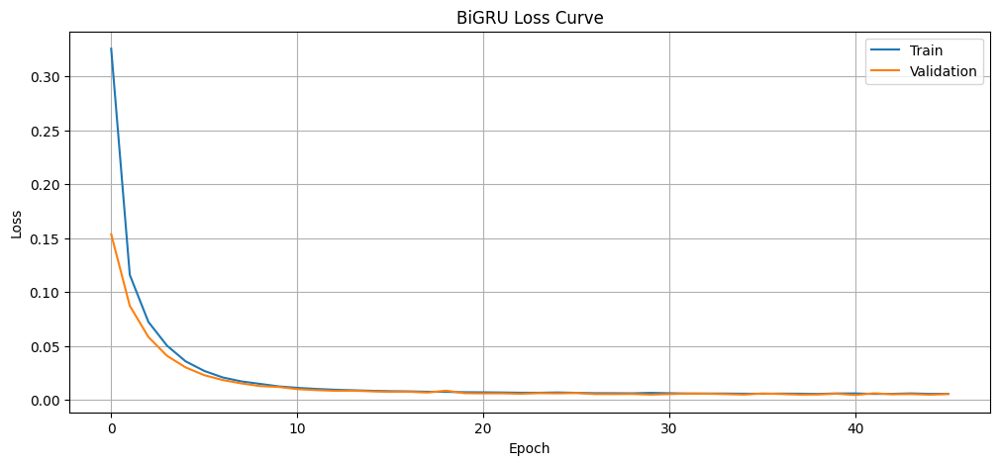

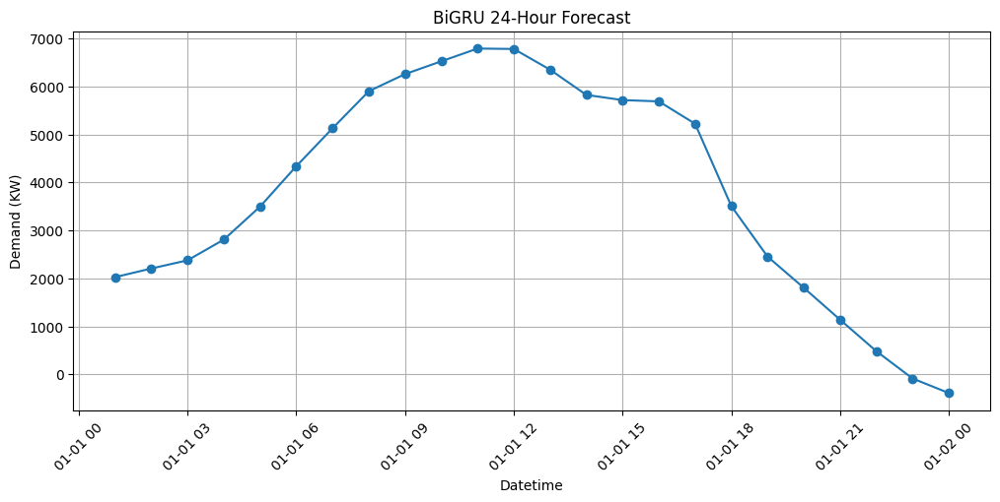


Model saved as BiGRU_demand_model.h5


In [ ]:
from tensorflow.keras.layers import Bidirectional, GRU, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from kerastuner.tuners import RandomSearch

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from datetime import timedelta

# ================= FEATURE ENGINEERING =================
df['lag_1'] = df['Demand(KW)'].shift(1)
df['lag_24'] = df['Demand(KW)'].shift(24)
df['lag_168'] = df['Demand(KW)'].shift(168)

df['rolling_mean_24'] = df['Demand(KW)'].rolling(24, min_periods=1).mean()
df['rolling_mean_168'] = df['Demand(KW)'].rolling(168, min_periods=1).mean()

df.dropna(inplace=True)

features = ['Demand(KW)', 'Temp (C)', 'Wind Gust', 'PF',
            'lag_1', 'lag_24', 'lag_168',
            'rolling_mean_24', 'rolling_mean_168']

X = df[features].values
y = df['Demand(KW)'].values

# ================= SEQUENCE CREATION =================
def create_sequences(X, y, time_steps=24):
    xs, ys = [], []
    for i in range(len(X) - time_steps):
        xs.append(X[i:i+time_steps])
        ys.append(y[i+time_steps])
    return np.array(xs), np.array(ys)

X_seq, y_seq = create_sequences(X, y, 24)

train_size = int(len(X_seq) * 0.6)
val_size   = int(len(X_seq) * 0.2)

X_train, y_train = X_seq[:train_size], y_seq[:train_size]
X_val, y_val     = X_seq[train_size:train_size+val_size], y_seq[train_size:train_size+val_size]
X_test, y_test   = X_seq[train_size+val_size:], y_seq[train_size+val_size:]

# ================= SCALING =================
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_val_scaled   = scaler_X.transform(X_val.reshape(-1, X_val.shape[-1])).reshape(X_val.shape)
X_test_scaled  = scaler_X.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1,1)).ravel()
y_val_scaled   = scaler_y.transform(y_val.reshape(-1,1)).ravel()
y_test_scaled  = scaler_y.transform(y_test.reshape(-1,1)).ravel()

# ================= BiGRU MODEL WITH TUNER =================
def build_model(hp):
    model = Sequential()
    model.add(Bidirectional(GRU(
        hp.Int("units1", 64, 256, step=64),
        return_sequences=True,
        kernel_regularizer=l2(hp.Choice("l2_reg", [0.001, 0.005]))
    ), input_shape=(X_train.shape[1], X_train.shape[2])))

    model.add(Dropout(hp.Choice("dropout1", [0.2, 0.3, 0.4])))

    model.add(Bidirectional(GRU(
        hp.Int("units2", 32, 128, step=32),
        kernel_regularizer=l2(hp.Choice("l2_reg", [0.001, 0.005]))
    )))

    model.add(Dropout(hp.Choice("dropout2", [0.2, 0.3, 0.4])))

    model.add(Dense(1))

    model.compile(
        optimizer=Adam(hp.Choice("lr", [1e-3, 5e-4, 1e-4])),
        loss="mse"
    )
    return model

tuner = RandomSearch(
    build_model,
    objective="val_loss",
    max_trials=10,
    directory="bigru_tuning",
    project_name="electricity_bigru"
)

tuner.search(
    X_train_scaled, y_train_scaled,
    validation_data=(X_val_scaled, y_val_scaled),
    epochs=50,
    batch_size=64,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)],
    verbose=1
)

best_hp = tuner.get_best_hyperparameters(1)[0]
model = tuner.hypermodel.build(best_hp)

history = model.fit(
    X_train_scaled, y_train_scaled,
    validation_data=(X_val_scaled, y_val_scaled),
    epochs=50,
    batch_size=64,
    callbacks=[EarlyStopping(patience=5, restore_best_weights=True)]
)

# ================= EVALUATION =================
def evaluate(model, X, y, scaler_y, name):
    y_pred_scaled = model.predict(X, verbose=0)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_true = scaler_y.inverse_transform(y.reshape(-1,1))
    print(f"\n{name} MSE = {mean_squared_error(y_true, y_pred):.4f}")
    print(f"{name} MAE = {mean_absolute_error(y_true, y_pred):.4f}")
    print(f"{name} R²  = {r2_score(y_true, y_pred):.4f}")
    return y_pred.ravel()

y_train_pred = evaluate(model, X_train_scaled, y_train_scaled, scaler_y, "TRAIN")
y_val_pred   = evaluate(model, X_val_scaled, y_val_scaled, scaler_y, "VAL")
y_test_pred  = evaluate(model, X_test_scaled, y_test_scaled, scaler_y, "TEST")

# ================= DATE INDEX FOR PLOT =================
dates = df.index[24:]
train_dates = dates[:train_size]
val_dates   = dates[train_size:train_size+val_size]
test_dates  = dates[train_size+val_size:]

y_train_true = scaler_y.inverse_transform(y_train_scaled.reshape(-1,1)).ravel()
y_val_true   = scaler_y.inverse_transform(y_val_scaled.reshape(-1,1)).ravel()
y_test_true  = scaler_y.inverse_transform(y_test_scaled.reshape(-1,1)).ravel()

# ================= PLOTTING =================
def plot_actual_vs_predicted(dates, actual, pred, title):
    plt.figure(figsize=(20,5))
    plt.plot(dates, actual, label="Actual")
    plt.plot(dates, pred, label="Predicted", linestyle="--")
    plt.title(title)
    plt.xlabel("Datetime")
    plt.ylabel("Demand (KW)")
    plt.xticks(rotation=45)
    plt.grid()
    plt.legend()
    plt.show()

plot_actual_vs_predicted(train_dates, y_train_true, y_train_pred, "TRAIN SET")
plot_actual_vs_predicted(val_dates, y_val_true, y_val_pred, "VALIDATION SET")
plot_actual_vs_predicted(test_dates, y_test_true, y_test_pred, "TEST SET")

# ================= LOSS CURVE =================
plt.figure(figsize=(12,5))
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.title("BiGRU Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend(["Train", "Validation"])
plt.grid()
plt.show()

# ================= 24-HOUR FORECAST =================
last_seq = X_seq[-1]
last_seq_scaled = scaler_X.transform(last_seq.reshape(-1, len(features))).reshape(1, 24, len(features))

forecast = []
forecast_dates = []

start_dt = df.index[-1] + timedelta(hours=1)
current = last_seq_scaled.copy()

for i in range(24):
    pred_scaled = model.predict(current, verbose=0)
    pred = scaler_y.inverse_transform(pred_scaled)[0,0]
    forecast.append(pred)
    forecast_dates.append(start_dt + timedelta(hours=i))

    next_features = current[0, -1, :].copy()
    next_features[0] = pred_scaled[0,0]

    current = np.roll(current, -1, axis=1)
    current[0, -1, :] = next_features

plt.figure(figsize=(12,5))
plt.plot(forecast_dates, forecast, marker='o')
plt.title("BiGRU 24-Hour Forecast")
plt.xlabel("Datetime")
plt.ylabel("Demand (KW)")
plt.xticks(rotation=45)
plt.grid()
plt.show()

# ================= SAVE MODEL =================
model.save("BiGRU_demand_model.h5")
print("\nModel saved as BiGRU_demand_model.h5")
